# Project: Identify Customer Segments

In this project, you will apply unsupervised learning techniques to identify segments of the population that form the core customer base for a mail-order sales company in Germany. These segments can then be used to direct marketing campaigns towards audiences that will have the highest expected rate of returns. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

This notebook will help you complete this task by providing a framework within which you will perform your analysis steps. In each step of the project, you will see some text describing the subtask that you will perform, followed by one or more code cells for you to complete your work. **Feel free to add additional code and markdown cells as you go along so that you can explore everything in precise chunks.** The code cells provided in the base template will outline only the major tasks, and will usually not be enough to cover all of the minor tasks that comprise it.

It should be noted that while there will be precise guidelines on how you should handle certain tasks in the project, there will also be places where an exact specification is not provided. **There will be times in the project where you will need to make and justify your own decisions on how to treat the data.** These are places where there may not be only one way to handle the data. In real-life tasks, there may be many valid ways to approach an analysis task. One of the most important things you can do is clearly document your approach so that other scientists can understand the decisions you've made.

At the end of most sections, there will be a Markdown cell labeled **Discussion**. In these cells, you will report your findings for the completed section, as well as document the decisions that you made in your approach to each subtask. **Your project will be evaluated not just on the code used to complete the tasks outlined, but also your communication about your observations and conclusions at each stage.**

In [1]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer

# magic word for producing visualizations in notebook
%matplotlib inline

pd.options.display.max_rows = None
pd.options.display.max_columns = None

### Step 0: Load the Data

There are four files associated with this project (not including this one):

- `AZDIAS_Subset.csv`: Demographics data for the general population of Germany; 891211 persons (rows) x 85 features (columns).
- `CUSTOMERS_Subset.csv`: Demographics data for customers of a mail-order company; 191652 persons (rows) x 85 features (columns).
- `Data_Dictionary.md`: Detailed information file about the features in the provided datasets.
- `Feature_Summary.csv`: Summary of feature attributes for demographics data; 85 features (rows) x 4 columns

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. You will use this information to cluster the general population into groups with similar demographic properties. Then, you will see how the people in the customers dataset fit into those created clusters. The hope here is that certain clusters are over-represented in the customers data, as compared to the general population; those over-represented clusters will be assumed to be part of the core userbase. This information can then be used for further applications, such as targeting for a marketing campaign.

To start off with, load in the demographics data for the general population into a pandas DataFrame, and do the same for the feature attributes summary. Note for all of the `.csv` data files in this project: they're semicolon (`;`) delimited, so you'll need an additional argument in your [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call to read in the data properly. Also, considering the size of the main dataset, it may take some time for it to load completely.

Once the dataset is loaded, it's recommended that you take a little bit of time just browsing the general structure of the dataset and feature summary file. You'll be getting deep into the innards of the cleaning in the first major step of the project, so gaining some general familiarity can help you get your bearings.

## Step 1 - read in data for trainings set

In [2]:
# Load in the general demographics data.
df_gen = pd.read_csv(filepath_or_buffer='AZDIAS_Subset.csv', delimiter=';')

# Load in the feature summary file.
df_feat = pd.read_csv(filepath_or_buffer='AZDIAS_Feature_Summary.csv', delimiter=';')

After the loading go to the **clean up** function below and execute it.

In [3]:
df_gen.columns

Index(['AGER_TYP', 'ALTERSKATEGORIE_GROB', 'ANREDE_KZ', 'CJT_GESAMTTYP',
       'FINANZ_MINIMALIST', 'FINANZ_SPARER', 'FINANZ_VORSORGER',
       'FINANZ_ANLEGER', 'FINANZ_UNAUFFAELLIGER', 'FINANZ_HAUSBAUER',
       'FINANZTYP', 'GEBURTSJAHR', 'GFK_URLAUBERTYP', 'GREEN_AVANTGARDE',
       'HEALTH_TYP', 'LP_LEBENSPHASE_FEIN', 'LP_LEBENSPHASE_GROB',
       'LP_FAMILIE_FEIN', 'LP_FAMILIE_GROB', 'LP_STATUS_FEIN',
       'LP_STATUS_GROB', 'NATIONALITAET_KZ', 'PRAEGENDE_JUGENDJAHRE',
       'RETOURTYP_BK_S', 'SEMIO_SOZ', 'SEMIO_FAM', 'SEMIO_REL', 'SEMIO_MAT',
       'SEMIO_VERT', 'SEMIO_LUST', 'SEMIO_ERL', 'SEMIO_KULT', 'SEMIO_RAT',
       'SEMIO_KRIT', 'SEMIO_DOM', 'SEMIO_KAEM', 'SEMIO_PFLICHT', 'SEMIO_TRADV',
       'SHOPPER_TYP', 'SOHO_KZ', 'TITEL_KZ', 'VERS_TYP', 'ZABEOTYP',
       'ALTER_HH', 'ANZ_PERSONEN', 'ANZ_TITEL', 'HH_EINKOMMEN_SCORE',
       'KK_KUNDENTYP', 'W_KEIT_KIND_HH', 'WOHNDAUER_2008',
       'ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'GEBAEUDETYP', 'KONSUMNAEHE',
       'MIN_

In [4]:
# Check the structure of the data after it's loaded (e.g. print the number of
# rows and columns, print the first few rows).
df_gen.head(5)

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GEBURTSJAHR,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,PRAEGENDE_JUGENDJAHRE,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,TITEL_KZ,VERS_TYP,ZABEOTYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,KK_KUNDENTYP,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,CAMEO_DEUG_2015,CAMEO_DEU_2015,CAMEO_INTL_2015,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_BAUMAX,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
0,-1,2,1,2.0,3,4,3,5,5,3,4,0,10.0,0,-1,15.0,4.0,2.0,2.0,1.0,1.0,0,0,5.0,2,6,7,5,1,5,3,3,4,7,6,6,5,3,-1,NaN,NaN,-1,3,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1,1,2,5.0,1,5,2,5,4,5,1,1996,10.0,0,3,21.0,6.0,5.0,3.0,2.0,1.0,1,14,1.0,5,4,4,3,1,2,2,3,6,4,7,4,7,6,3,1.0,0.0,2,5,0.0,2.0,0.0,6.0,NaN,3.0,9.0,11.0,0.0,8.0,1.0,1992.0,W,4.0,8,8A,51,0.0,0.0,0.0,2.0,5.0,1.0,6.0,3.0,8.0,3.0,2.0,1.0,3.0,3.0,963.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0
2,-1,3,2,3.0,1,4,1,2,3,5,1,1979,10.0,1,3,3.0,1.0,1.0,1.0,3.0,2.0,1,15,3.0,4,1,3,3,4,4,6,3,4,7,7,7,3,3,2,0.0,0.0,1,5,17.0,1.0,0.0,4.0,NaN,3.0,9.0,10.0,0.0,1.0,5.0,1992.0,W,2.0,4,4C,24,1.0,3.0,1.0,0.0,0.0,3.0,2.0,4.0,4.0,4.0,2.0,3.0,2.0,2.0,712.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,3.0,5.0,2.0
3,2,4,2,2.0,4,2,5,2,1,2,6,1957,1.0,0,2,0.0,0.0,0.0,0.0,9.0,4.0,1,8,2.0,5,1,2,1,4,4,7,4,3,4,4,5,4,4,1,0.0,0.0,1,3,13.0,0.0,0.0,1.0,NaN,NaN,9.0,1.0,0.0,1.0,4.0,1997.0,W,7.0,2,2A,12,4.0,1.0,0.0,0.0,1.0,4.0,4.0,2.0,6.0,4.0,0.0,4.0,1.0,0.0,596.0,2.0,2.0,2.0,0.0,1.0,3.0,4.0,2.0,3.0,3.0
4,-1,3,1,5.0,4,3,4,1,3,2,5,1963,5.0,0,3,32.0,10.0,10.0,5.0,3.0,2.0,1,8,5.0,6,4,4,2,7,4,4,6,2,3,2,2,4,2,2,0.0,0.0,2,4,20.0,4.0,0.0,5.0,1.0,2.0,9.0,3.0,0.0,1.0,4.0,1992.0,W,3.0,6,6B,43,1.0,4.0,1.0,0.0,0.0,3.0,2.0,5.0,1.0,5.0,3.0,3.0,5.0,5.0,435.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,4.0,6.0,5.0


In [5]:
df_gen.describe()

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GEBURTSJAHR,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,PRAEGENDE_JUGENDJAHRE,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,TITEL_KZ,VERS_TYP,ZABEOTYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,KK_KUNDENTYP,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_BAUMAX,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
count,891221.000000,891221.000000,891221.000000,886367.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,886367.000000,891221.000000,891221.000000,886367.000000,886367.000000,886367.000000,886367.000000,886367.000000,886367.000000,891221.000000,891221.000000,886367.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,817722.000000,817722.000000,891221.000000,891221.000000,817722.000000,817722.000000,817722.000000,872873.000000,306609.000000,783619.000000,817722.000000,798073.000000,794213.000000,798073.000000,817252.000000,798073.000000,798073.000000,757897.000000,757897.000000,757897.000000,757897.000000,757897.000000,757897.000000,797481.000000,797481.000000,797481.000000,798066.000000,770025.000000,757897.000000,886367.000000,770025.000000,785421.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,794005.000000,794005.000000,794005.00000
mean,-0.358435,2.777398,1.522098,3.632838,3.074528,2.821039,3.401106,3.033328,2.874167,3.075121,3.790586,1101.178533,7.350304,0.196612,1.792102,14.622637,4.453621,3.599574,2.185966,4.791151,2.432575,1.026827,8.154346,3.419630,3.945860,4.272729,4.240609,4.001597,4.023709,4.359086,4.481405,4.025014,3.910139,4.763223,4.667550,4.445007,4.256076,3.661784,1.266967,0.008423,0.003483,1.197852,3.362438,10.864126,1.727637,0.004162,4.207243,3.410640,3.933406,7.908791,8.287263,0.040647,2.798641,3.018452,1993.277011,4.052836,1.494277,1.265584,0.624525,0.305927,1.389552,3.158580,4.153043,3.939172,4.549491,3.738306,2.592991,2.963540,2.698691,4.257967,619.701439,2.253330,2.801858,1.595426,0.699166,1.943913,3.612821,3.381087,3.167854,5.293002,3.07222
std,1.198724,1.068775,0.499512,1.595021,1.321055,1.464749,1.322134,1.529603,1.486731,1.353248,1.987876,976.583551,3.525723,0.397437,1.269062,12.616883,3.855639,3.926486,1.756537,3.425305,1.474315,0.586634,4.844532,1.417741,1.946564,1.915885,2.007373,1.857540,2.077746,2.022829,1.807552,1.903816,1.580306,1.830789,1.795712,1.852412,1.770137,1.707637,1.287435,0.091392,0.084957,0.952532,1.352704,7.639683,1.155849,0.068855,1.624057,1.628844,1.964701,1.923137,15.628087,0.324028,2.656713,1.550312,3.332739,1.949539,1.403961,1.245178,1.013443,0.638725,1.779483,1.329537,2.183710,1.718996,2.028919,0.923193,1.119052,1.428882,1.521524,2.030385,340.034318,0.972008,0.920309,0.986736,0.727137,1.459654,0.973967,1.111598,1.002376,2.303739,1.36298
min,-1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000

In [6]:
print(df_gen.shape)
print()
print(df_gen.info())

(891221, 85)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Data columns (total 85 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   AGER_TYP               891221 non-null  int64  
 1   ALTERSKATEGORIE_GROB   891221 non-null  int64  
 2   ANREDE_KZ              891221 non-null  int64  
 3   CJT_GESAMTTYP          886367 non-null  float64
 4   FINANZ_MINIMALIST      891221 non-null  int64  
 5   FINANZ_SPARER          891221 non-null  int64  
 6   FINANZ_VORSORGER       891221 non-null  int64  
 7   FINANZ_ANLEGER         891221 non-null  int64  
 8   FINANZ_UNAUFFAELLIGER  891221 non-null  int64  
 9   FINANZ_HAUSBAUER       891221 non-null  int64  
 10  FINANZTYP              891221 non-null  int64  
 11  GEBURTSJAHR            891221 non-null  int64  
 12  GFK_URLAUBERTYP        886367 non-null  float64
 13  GREEN_AVANTGARDE       891221 non-null  int64  
 14  HEALTH_TYP            

In [7]:
df_gen.describe(include=['object', 'category'])

,OST_WEST_KZ,CAMEO_DEUG_2015,CAMEO_DEU_2015,CAMEO_INTL_2015
count,798073,792242,792242,792242
unique,2,10,45,22
top,W,8,6B,51
freq,629528,134441,56672,133694


In [8]:
# for learning effect: this has no meaning, because ALTERSKATEGORIE_GROB is an ordinal column (ordered categorial)
print(df_gen['ALTERSKATEGORIE_GROB'].describe())
print()

# this makes more sense
print(df_gen['ALTERSKATEGORIE_GROB'].value_counts())
print()
print(df_gen['ALTERSKATEGORIE_GROB'].nunique())

count    891221.000000
mean          2.777398
std           1.068775
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max           9.000000
Name: ALTERSKATEGORIE_GROB, dtype: float64

ALTERSKATEGORIE_GROB
3    358533
4    228510
2    158410
1    142887
9      2881
Name: count, dtype: int64

5


> **Tip**: Add additional cells to keep everything in reasonably-sized chunks! Keyboard shortcut `esc --> a` (press escape to enter command mode, then press the 'A' key) adds a new cell before the active cell, and `esc --> b` adds a new cell after the active cell. If you need to convert an active cell to a markdown cell, use `esc --> m` and to convert to a code cell, use `esc --> y`. 

## Step 1: Preprocessing

### Step 1.1: Assess Missing Data

The feature summary file contains a summary of properties for each demographics data column. You will use this file to help you make cleaning decisions during this stage of the project. First of all, you should assess the demographics data in terms of missing data. Pay attention to the following points as you perform your analysis, and take notes on what you observe. Make sure that you fill in the **Discussion** cell with your findings and decisions at the end of each step that has one!

#### Step 1.1.1: Convert Missing Value Codes to NaNs
The fourth column of the feature attributes summary (loaded in above as `feat_info`) documents the codes from the data dictionary that indicate missing or unknown data. While the file encodes this as a list (e.g. `[-1,0]`), this will get read in as a string object. You'll need to do a little bit of parsing to make use of it to identify and clean the data. Convert data that matches a 'missing' or 'unknown' value code into a numpy NaN value. You might want to see how much data takes on a 'missing' or 'unknown' code, and how much data is naturally missing, as a point of interest.

**As one more reminder, you are encouraged to add additional cells to break up your analysis into manageable chunks.**

In [9]:
# REMARKS: this code is not executed anymore, becaue it is integrated in the clean_data function

# identify missing or unknown data values and convert them to NaNs.
import re

# we should convert the string in form of a python list so that for example from [-1,XX] will become [-1,'XX']
def convert_to_list(missing_string):
    processed_string = re.sub(r'(?<=,|\[)\s*([A-Za-z]+)\s*(?=,|\])', r'"\1"', missing_string)    
    return eval(processed_string)

for index, row in df_feat.iterrows():    
    column_name = row['attribute']    
    missing_values = convert_to_list(row['missing_or_unknown'])

    # nothing to replace if list is empty
    if len(missing_values) == 0:
        continue
        
    df_gen[column_name] = df_gen[column_name].replace(missing_values, np.nan)

df_gen.head(20)

,AGER_TYP,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GEBURTSJAHR,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,PRAEGENDE_JUGENDJAHRE,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,TITEL_KZ,VERS_TYP,ZABEOTYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,KK_KUNDENTYP,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,CAMEO_DEUG_2015,CAMEO_DEU_2015,CAMEO_INTL_2015,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_BAUMAX,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
0,NaN,2.0,1,2.0,3,4,3,5,5,3,4,NaN,10.0,0,NaN,15.0,4.0,2.0,2.0,1.0,1.0,NaN,NaN,5.0,2,6,7,5,1,5,3,3,4,7,6,6,5,3,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,1.0,2,5.0,1,5,2,5,4,5,1,1996.0,10.0,0,3.0,21.0,6.0,5.0,3.0,2.0,1.0,1.0,14.0,1.0,5,4,4,3,1,2,2,3,6,4,7,4,7,6,3.0,1.0,NaN,2.0,5,NaN,2.0,0.0,6.0,NaN,3.0,9.0,11.0,0.0,8.0,1.0,1992.0,W,4.0,8,8A,51,0.0,0.0,0.0,2.0,5.0,1.0,6.0,3.0,8.0,3.0,2.0,1.0,3.0,3.0,963.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0
2,NaN,3.0,2,3.0,1,4,1,2,3,5,1,1979.0,10.0,1,3.0,3.0,1.0,1.0,1.0,3.0,2.0,1.0,15.0,3.0,4,1,3,3,4,4,6,3,4,7,7,7,3,3,2.0,0.0,NaN,1.0,5,17.0,1.0,0.0,4.0,NaN,3.0,9.0,10.0,0.0,1.0,5.0,1992.0,W,2.0,4,4C,24,1.0,3.0,1.0,0.0,NaN,3.0,2.0,4.0,4.0,4.0,2.0,3.0,2.0,2.0,712.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,3.0,5.0,2.0
3,2.0,4.0,2,2.0,4,2,5,2,1,2,6,1957.0,1.0,0,2.0,NaN,NaN,NaN,NaN,9.0,4.0,1.0,8.0,2.0,5,1,2,1,4,4,7,4,3,4,4,5,4,4,1.0,0.0,NaN,1.0,3,13.0,0.0,0.0,1.0,NaN,NaN,9.0,1.0,0.0,1.0,4.0,1997.0,W,7.0,2,2A,12,4.0,1.0,0.0,0.0,1.0,4.0,4.0,2.0,6.0,4.0,NaN,4.0,1.0,NaN,596.0,2.0,2.0,2.0,0.0,1.0,3.0,4.0,2.0,3.0,3.0
4,NaN,3.0,1,5.0,4,3,4,1,3,2,5,1963.0,5.0,0,3.0,32.0,10.0,10.0,5.0,3.0,2.0,1.0,8.0,5.0,6,4,4,2,7,4,4,6,2,3,2,2,4,2,2.0,0.0,NaN,2.0,4,20.0,4.0,0.0,5.0,1.0,2.0,9.0,3.0,0.0,1.0,4.0,1992.0,W,3.0,6,6B,43,1.0,4.0,1.0,0.0,NaN,3.0,2.0,5.0,1.0,5.0,3.0,3.0,5.0,5.0,435.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,4.0,6.0,5.0
5,3.0,1.0,2,2.0,3,1,5,2,2,5,2,1943.0,1.0,0,3.0,8.0,2.0,1.0,1.0,4.0,2.0,1.0,3.0,3.0,2,4,7,4,2,2,2,5,7,4,4,4,7,6,0.0,0.0,NaN,2.0,4,10.0,1.0,0.0,5.0,3.0,6.0,9.0,5.0,0.0,1.0,5.0,1992.0,W,7.0,8,8C,54,2.0,2.0,0.0,0.0,NaN,4.0,6.0,2.0,7.0,4.0,4.0,4.0,1.0,5.0,1300.0,2.0,3.0,1.0,1.0,1.0,5.0,5.0,2.0,3.0,3.0
6,NaN,2.0,2,5.0,1,5,1,5,4,3,4,NaN,12.0,0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,10.0,4.0,2,5,5,7,2,6,5,5,7,7,4,7,7,7,1.0,0.0,NaN,1.0,4,NaN,1.0,0.0,6.0,NaN,3.0,9.0,4.0,0.0,1.0,5.0,1992.0,W,5.0,4,4A,22,3.0,2.0,0.0,0.0,1.0,3.0,6.0,4.0,3.0,5.0,3.0,5.0,2.0,5.0,867.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,4.0,6.0,3.0
7,NaN,1.0,1,3.0,3,3,4,1,3,2,5,1964.0,9.0,0,1.0,5.0,2.0,1.0,1.0,1.0,1.0,1.0,8.0,5.0,7,7,7,5,6,2,2,7,5,1,1,2,5,5,0.0,0.0,NaN,1.0,1,14.0,1.0,0.0,4.0,NaN,5.0,9.0,6.0,0.0,8.0,3.0,1992.0,W,1.0,2,2D,14,2.0,2.0,0.0,0.0,NaN,4.0,2.0,5.0,3.0,4.0,1.0,4.0,1.0,1.0,758.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,2.0,5.0,2.0
8,NaN,3.0,1,3.0,4,4,2,4,2,2,6,1974.0,3.0,1,3.0,10.0,3.0,1.0,1.0,10.0,5.0,1.0,11.0,4.0,4,5,4,1,5,6,4,5,2,5,5,3,1,4,3.0,0.0,NaN,2.0,6,16.0,1.0,0.0,3.0,NaN,5.0,8.0,2.0,1.0,3.0,4.0,1992.0,W,1.0,1,1A,13,1.0,1.0,0.0,0.0,NaN,5.0,3.0,4.0,4.0,4.0,1.0,3.0,2.0,3.0,511.0,2.0,3.0,2.0,1.0,1.0,3.0,3.0,2.0,4.0,3.0
9,NaN,3.0,2,4.0,2,4,2,3,5,4,1,1975.0,12.0,1,2.0,4.0,1.0,1.0,1.0,3.0,2.0,1.0,15.0,4.0,2,1,1,3,2,6,6,3,4,7,6,7,1,3,3.0,0.0,NaN,2.0,4,17.0,1.0,0.0,4.0,6.0,4.0,3.0,9.0,0.0,3.0,4.0,1992.0,W,7.0,1,1E,15,1.0,3.0,1.0,0.0,NaN,2.0,6.

In [10]:
df_gen['CAMEO_DEUG_2015'].head(20)

0     NaN
1       8
2       4
3       2
4       6
5       8
6       4
7       2
8       1
9       1
10      9
11    NaN
12      6
13      5
14    NaN
15      8
16      7
17    NaN
18      4
19      5
Name: CAMEO_DEUG_2015, dtype: object

In [11]:
non_numeric_columns = df_gen.select_dtypes(exclude=[np.number]).columns
print("Non numeric columns:", non_numeric_columns)
print()

# numeric_df_gen = df_gen.select_dtypes(include=[np.number])
# correlations = numeric_df_gen.corr()
# print(correlations)

Non numeric columns: Index(['OST_WEST_KZ', 'CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'CAMEO_INTL_2015'], dtype='object')



#### Step 1.1.2: Assess Missing Data in Each Column

How much missing data is present in each column? There are a few columns that are outliers in terms of the proportion of values that are missing. You will want to use matplotlib's [`hist()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html) function to visualize the distribution of missing value counts to find these columns. Identify and document these columns. While some of these columns might have justifications for keeping or re-encoding the data, for this project you should just remove them from the dataframe. (Feel free to make remarks about these outlier columns in the discussion, however!)

For the remaining features, are there any patterns in which columns have, or share, missing data?

In [12]:
print("Number of rows: " + str(df_gen.shape[0]))
print()

nan_counts = df_gen.isnull().sum()

Number of rows: 891221



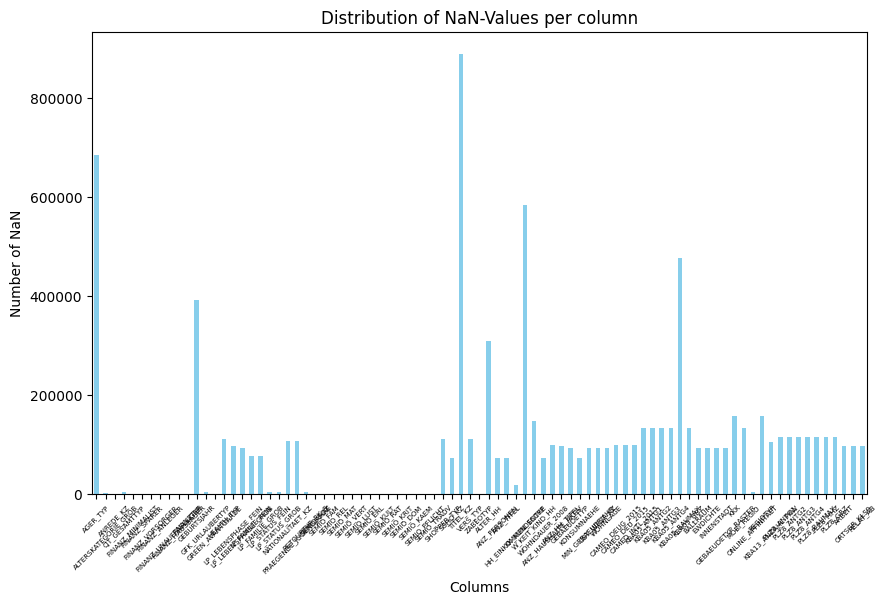

In [13]:
plt.figure(figsize=(10, 6))
nan_counts.plot(kind='bar', color='skyblue')

plt.title('Distribution of NaN-Values per column')
plt.xlabel('Columns')
plt.ylabel('Number of NaN')
plt.xticks(rotation=45, fontsize=5)

plt.show()

This here will give an additional overview as the diagram above.

In [14]:
nan_counts = df_gen.isnull().sum()

# sort after nan counts
sorted_nan_counts = nan_counts.sort_values(ascending=False)

print("Columns with most NaN values:")
print(sorted_nan_counts)

Columns with most NaN values:
TITEL_KZ                 889061
AGER_TYP                 685843
KK_KUNDENTYP             584612
KBA05_BAUMAX             476524
GEBURTSJAHR              392318
ALTER_HH                 310267
KKK                      158064
REGIOTYP                 158064
W_KEIT_KIND_HH           147988
KBA05_ANTG1              133324
KBA05_GBZ                133324
KBA05_ANTG2              133324
KBA05_ANTG3              133324
KBA05_ANTG4              133324
MOBI_REGIO               133324
PLZ8_ANTG2               116515
PLZ8_ANTG3               116515
PLZ8_BAUMAX              116515
PLZ8_ANTG4               116515
PLZ8_HHZ                 116515
PLZ8_GBZ                 116515
PLZ8_ANTG1               116515
SHOPPER_TYP              111196
HEALTH_TYP               111196
VERS_TYP                 111196
NATIONALITAET_KZ         108315
PRAEGENDE_JUGENDJAHRE    108164
KBA13_ANZAHL_PKW         105800
ANZ_HAUSHALTE_AKTIV       99611
CAMEO_DEU_2015            99352
CAMEO_INTL

In [15]:
# lets have a look at the TITEL_KZ column
df_gen['TITEL_KZ'].head(20)

# Compare that with the unmodified data
df_gen_orig = pd.read_csv(filepath_or_buffer='AZDIAS_Subset.csv', delimiter=';')
df_gen_orig['TITEL_KZ'].head(20)

0     NaN
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    NaN
12    0.0
13    0.0
14    NaN
15    0.0
16    0.0
17    NaN
18    0.0
19    0.0
Name: TITEL_KZ, dtype: float64

Looks as the column **TITEL_KZ** does not make sense, because it is nearly empty.

In [17]:
# REMARKS: not executed anymore because of clean_data function
# Perform an assessment of how much missing data there is in each column of the
# dataset.

# missing values per column in percent
missing_percentage = df_gen.isnull().mean() * 100

#print(missing_percentage)

# potential drop candidates (I stick to 50 percent as a threshold)
columns_to_drop_20 = missing_percentage[missing_percentage > 20].index
columns_to_drop_50 = missing_percentage[missing_percentage > 50].index
columns_to_drop_70 = missing_percentage[missing_percentage > 70].index

print("Columns with more than 70% missing values:", columns_to_drop_70)
print("Columns with more than 50% missing values:", columns_to_drop_50)
print("Columns with more than 20% missing values:", columns_to_drop_20)

Columns with more than 70% missing values: Index(['AGER_TYP', 'TITEL_KZ'], dtype='object')
Columns with more than 50% missing values: Index(['AGER_TYP', 'TITEL_KZ', 'KK_KUNDENTYP', 'KBA05_BAUMAX'], dtype='object')
Columns with more than 20% missing values: Index(['AGER_TYP', 'GEBURTSJAHR', 'TITEL_KZ', 'ALTER_HH', 'KK_KUNDENTYP',
       'KBA05_BAUMAX'],
      dtype='object')


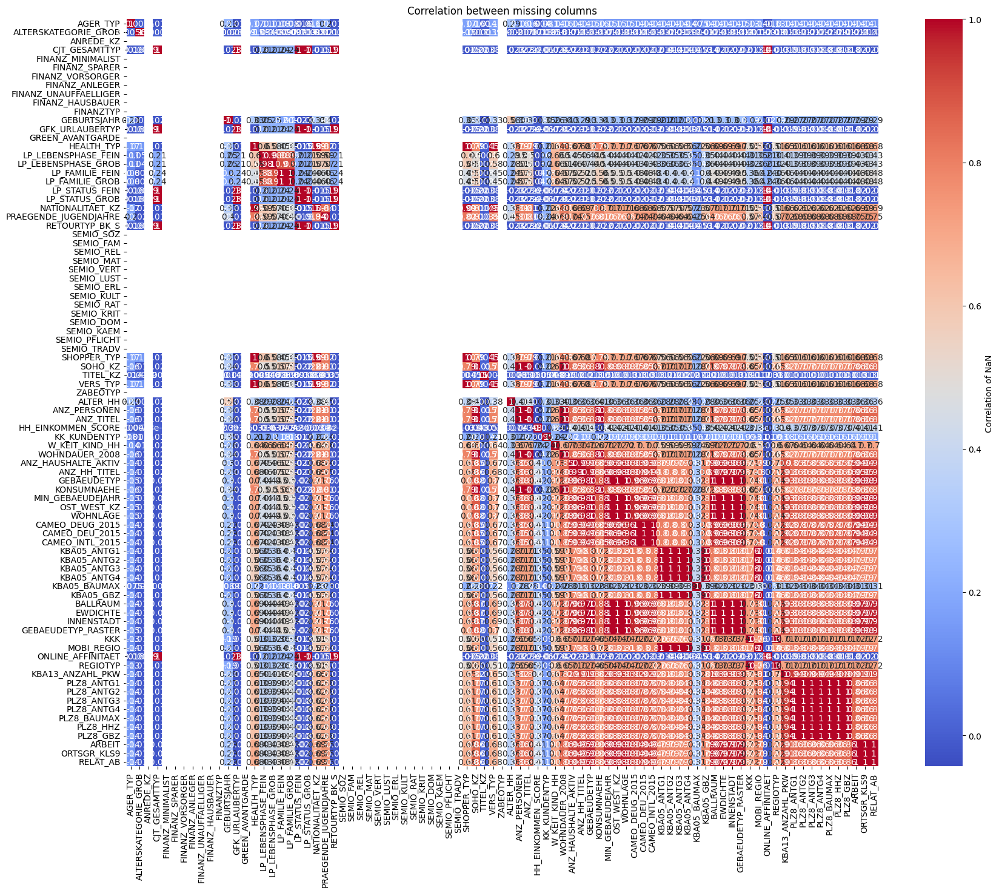

In [19]:
# Investigate patterns in the amount of missing data in each column.
import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap of correlations of missing values
plt.figure(figsize=(20, 16))
sns.heatmap(df_gen.isnull().corr(), annot=True, cmap='coolwarm', cbar_kws={'label': 'Correlation of NaN'})
plt.title('Correlation between missing columns')
plt.show()

This is not very clear and cannot be read. Lets try another aproach with **plotly**. Because plotly is interactive you can zoom in and zoom out.

In [21]:
import plotly.express as px

nan_corr = df_gen.isnull().corr()
fig = px.imshow(nan_corr, 
                labels=dict(x="Features", y="Features", color="Correlation of NaN"),
                x=nan_corr.columns,
                y=nan_corr.columns,
                aspect="auto")
fig.update_layout(title='Interactive Heatmap for missing values', width=1000, height=800)
fig.show()

This correlation quantifies whether missing values tend to co-occur across different columns.

How to Interpret the Correlation Values

Positive Correlation (close to 1):

If two columns have a high positive correlation (e.g., 0.9), it means that when one column has a missing value, the other column is also likely to have a missing value.

Negative Correlation (close to -1):

This is rare for missing values, but it could imply that missingness in one column is inversely related to missingness in another. For example, one column might systematically have data only when another column does not.

Near Zero Correlation (around 0):

Little to no relationship between missingness in the two columns.

This is much better! With that heatmap one can wonderfully see the correlations of NaN values between columns. For example the column pair of **'Innenstadt'** und **'EWDICHTE'** has a correlation of **1**! And blue fields have a very low correlation (that means it is more random).

In [22]:
# Remove the outlier columns from the dataset. (You'll perform other data
# engineering tasks such as re-encoding and imputation later.)
df_cleaned = df_gen.drop(columns=columns_to_drop_50)
print("Shape cleaned: " + str(df_cleaned.shape))
print("Shape original: " + str(df_gen.shape))

Shape cleaned: (891221, 81)
Shape original: (891221, 85)


#### Discussion 1.1.2: Assess Missing Data in Each Column

So I think it is clear, that the TITEL_KZ column does not contain any useful info and can be discarded (from the data set). The AGER_TYP column is also not very useful, because mor than 70% of its data is missing. KK_KUNDENTYP is also more than 50% undefined or unknown so, it should be ok to discard it.


Columns to discard:

- TITEL_KZ
- AGER_TYP
- KK_KUNDENTYP
- KBA05_BAUMAX

#### Step 1.1.3: Assess Missing Data in Each Row

Now, you'll perform a similar assessment for the rows of the dataset. How much data is missing in each row? As with the columns, you should see some groups of points that have a very different numbers of missing values. Divide the data into two subsets: one for data points that are above some threshold for missing values, and a second subset for points below that threshold.

In order to know what to do with the outlier rows, we should see if the distribution of data values on columns that are not missing data (or are missing very little data) are similar or different between the two groups. Select at least five of these columns and compare the distribution of values.
- You can use seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) function to create a bar chart of code frequencies and matplotlib's [`subplot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplot.html) function to put bar charts for the two subplots side by side.
- To reduce repeated code, you might want to write a function that can perform this comparison, taking as one of its arguments a column to be compared.

Depending on what you observe in your comparison, this will have implications on how you approach your conclusions later in the analysis. If the distributions of non-missing features look similar between the data with many missing values and the data with few or no missing values, then we could argue that simply dropping those points from the analysis won't present a major issue. On the other hand, if the data with many missing values looks very different from the data with few or no missing values, then we should make a note on those data as special. We'll revisit these data later on. **Either way, you should continue your analysis for now using just the subset of the data with few or no missing values.**

In [23]:
# How much data is missing in each row of the dataset?
nan_counts_per_row = df_cleaned.isnull().sum(axis=1)
#print(df_cleaned.iloc[1,:])

#print(nan_counts_per_row.shape)
print("NaN counts per row (first 10): ")
print(nan_counts_per_row.head(10))
print()

# statistical overview of the missing data
nan_summary = nan_counts_per_row.describe()
print(nan_summary)


NaN counts per row (first 10): 
0    45
1     1
2     0
3     7
4     0
5     0
6     2
7     0
8     0
9     0
dtype: int64

count    891221.000000
mean          6.438234
std          13.598083
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max          50.000000
dtype: float64


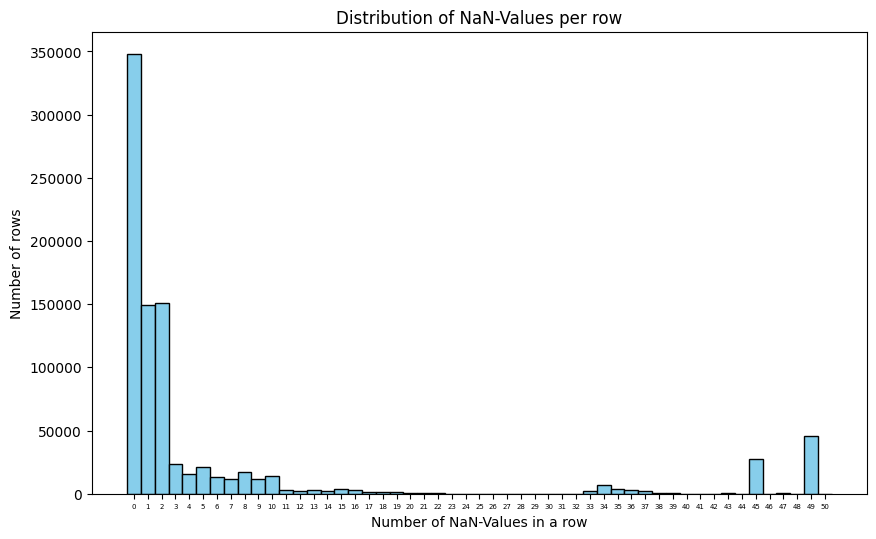

In [140]:
import matplotlib.pyplot as plt

# Histogramm of the NaN-values per row
plt.figure(figsize=(10, 6))
plt.hist(nan_counts_per_row, bins=range(nan_counts_per_row.max() + 2), color='skyblue', edgecolor='black', align='left')
plt.title('Distribution of NaN-Values per row')
plt.xlabel('Number of NaN-Values in a row')
plt.ylabel('Number of rows')
plt.xticks(range(nan_counts_per_row.max() + 1), fontsize='5')
plt.show()

In [25]:
# Write code to divide the data into two subsets based on the number of missing
# values in each row.
threshold = 25 # max allowed NaN per row

# identify rows which have more NaN values than threshold (nifty pandas pattern)
rows_to_drop = nan_counts_per_row[nan_counts_per_row > threshold].index
rows_to_keep = nan_counts_per_row[nan_counts_per_row < threshold].index
#print(rows_to_drop)

print("Threshold >: " + str(rows_to_drop.shape[0]))
print("Threshold <: " + str(rows_to_keep.shape[0]))

df_many_nans = df_cleaned.loc[rows_to_drop]
df_few_nans = df_cleaned.loc[rows_to_keep]

df_many_nans.head(10)

# remove those rows
df_reduced = df_cleaned.drop(rows_to_drop)

print(f"Rows with more than {threshold} NaN-values have been removed.")
#print(df_reduced)

Threshold >: 93318
Threshold <: 797795
Rows with more than 25 NaN-values have been removed.


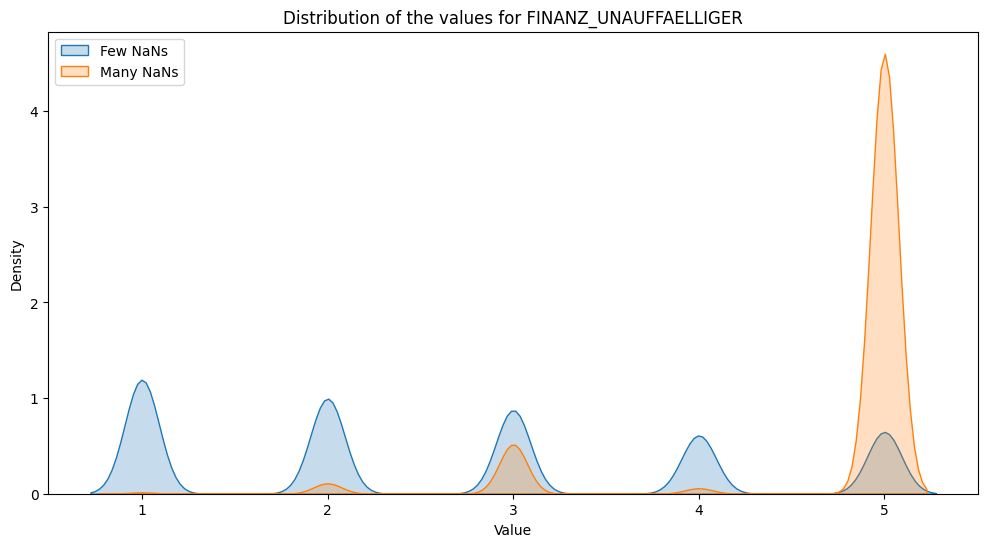

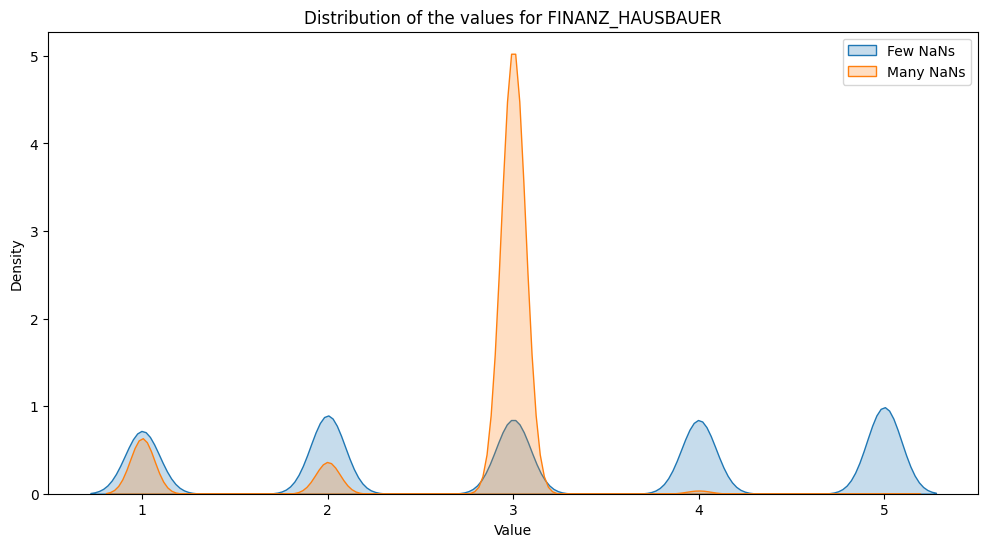

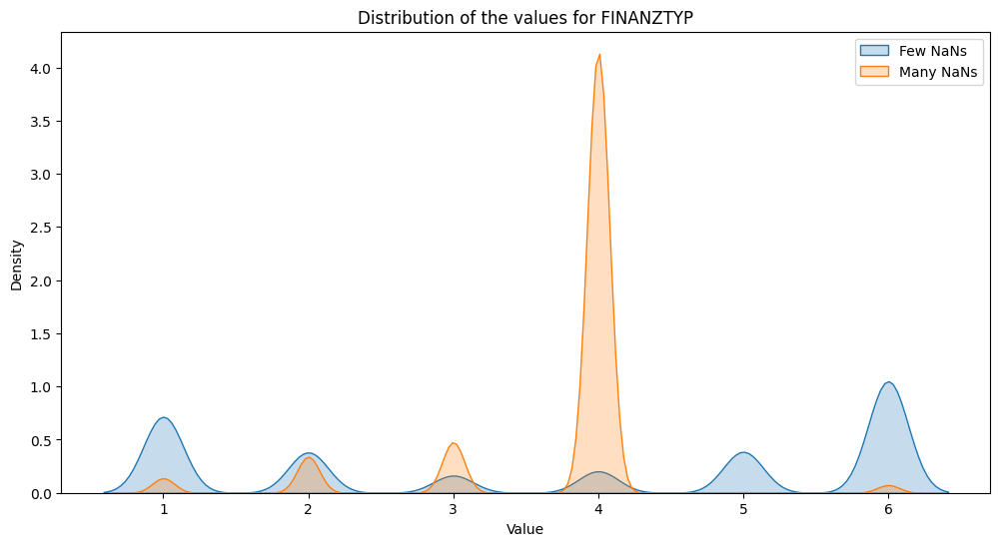

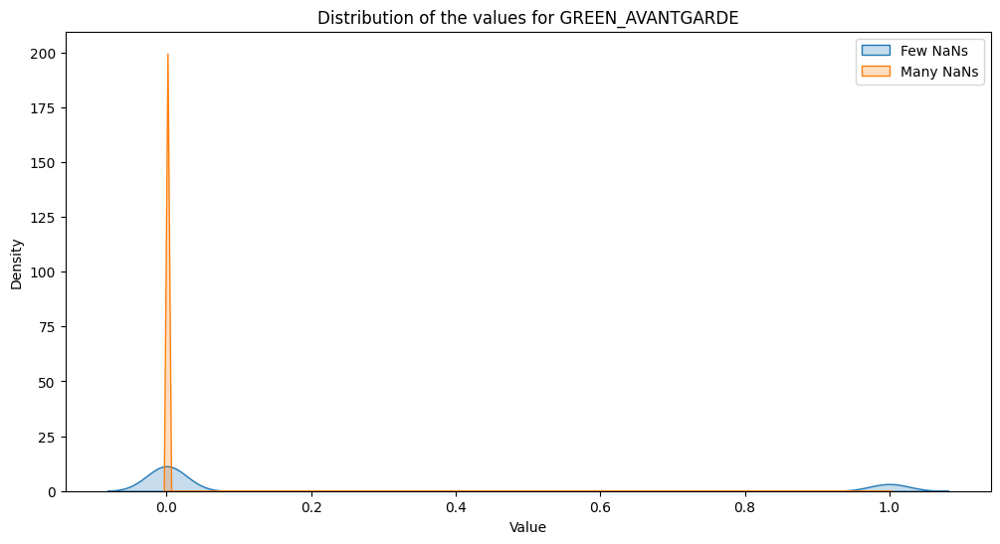

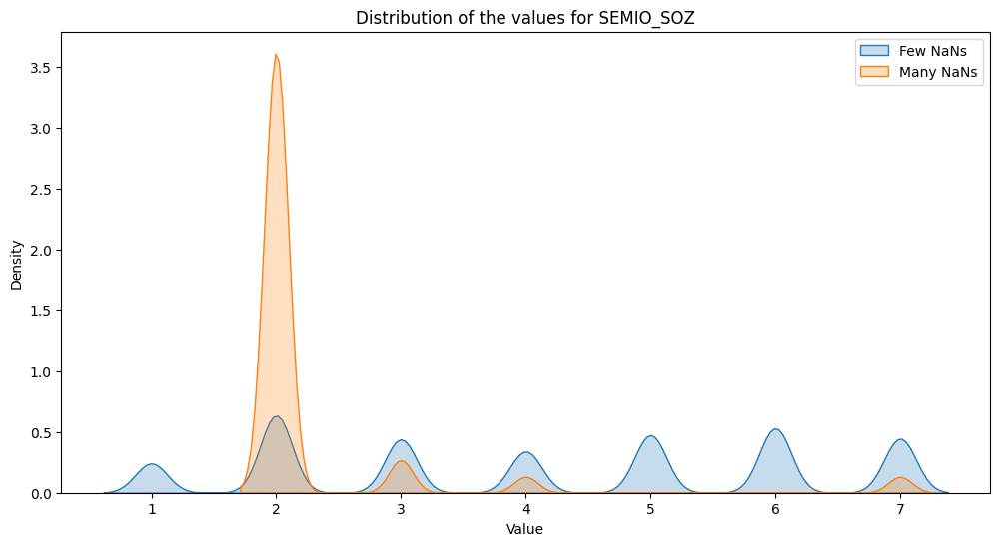

In [26]:
# Compare the distribution of values for at least five columns where there are
# no or few missing values, between the two subsets.

# this here selects columns which are definitively contained in both subsets
selected_columns = df_cleaned.columns[df_cleaned.isnull().sum() < threshold]

#print(selected_columns)

for column in selected_columns[5:10]:  # chose 5 columns and visualize the density in both subsets
    plt.figure(figsize=(12, 6))
    sns.kdeplot(df_few_nans[column].dropna(), label='Few NaNs', fill=True)
    sns.kdeplot(df_many_nans[column].dropna(), label='Many NaNs', fill=True)
    plt.title(f'Distribution of the values for {column}')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

In [27]:
few_nans_stats = df_few_nans.describe()
many_nans_stats = df_many_nans.describe()

print("Stats rows with few NaNs:")
print(few_nans_stats['ALTERSKATEGORIE_GROB'])

print("\nStats for rows with many NaNs:")
print(many_nans_stats['ALTERSKATEGORIE_GROB'])

Stats rows with few NaNs:
count    794996.000000
mean          2.795376
std           1.018472
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max           4.000000
Name: ALTERSKATEGORIE_GROB, dtype: float64

Stats for rows with many NaNs:
count    93237.000000
mean         2.431642
std          0.868873
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          4.000000
Name: ALTERSKATEGORIE_GROB, dtype: float64


Ok, I think it is better if I compare the features automatically with a script:

In [28]:
difference_threshold = 0.30  # 30%

# list of significant different features
significant_features = []

# loop through features which are in both subsets
for column in selected_columns:
    # calculate mean and std
    few_nans_mean = df_few_nans[column].mean()
    many_nans_mean = df_many_nans[column].mean()
    few_nans_std = df_few_nans[column].std()
    many_nans_std = df_many_nans[column].std()

    # difference between means in percent
    if few_nans_mean != 0:  # avoid division by zero
        mean_difference = abs(few_nans_mean - many_nans_mean) / abs(few_nans_mean)

        # check difference_threshold
        if mean_difference > difference_threshold:
            significant_features.append({
                'Feature': column,
                'Few NaNs Mean': few_nans_mean,
                'Many NaNs Mean': many_nans_mean,
                'Few NaNs Std': few_nans_std,
                'Many NaNs Std': many_nans_std,
                'Mean Difference (%)': mean_difference * 100
            })

if significant_features:
    print("Significantly different features based on mean difference:")
    for feature_info in significant_features:
        print(feature_info)
else:
    print("No significantly different features found.")

Significantly different features based on mean difference:
{'Feature': 'FINANZ_SPARER', 'Few NaNs Mean': np.float64(2.7158593372984288), 'Many NaNs Mean': np.float64(3.7195074905162993), 'Few NaNs Std': np.float64(1.4850734397922167), 'Many NaNs Std': np.float64(0.8550504374097047), 'Mean Difference (%)': np.float64(36.955085980860794)}
{'Feature': 'FINANZ_ANLEGER', 'Few NaNs Mean': np.float64(2.8407159734016885), 'Many NaNs Mean': np.float64(4.679150860498511), 'Few NaNs Std': np.float64(1.47268087662067), 'Many NaNs Std': np.float64(0.8797428422323037), 'Mean Difference (%)': np.float64(64.71730733767589)}
{'Feature': 'FINANZ_UNAUFFAELLIGER', 'Few NaNs Mean': np.float64(2.6578594751784608), 'Many NaNs Mean': np.float64(4.721843588589554), 'Few NaNs Std': np.float64(1.3993488420909153), 'Many NaNs Std': np.float64(0.7425335455007611), 'Mean Difference (%)': np.float64(77.65587807355796)}
{'Feature': 'GREEN_AVANTGARDE', 'Few NaNs Mean': np.float64(0.21960654052732845), 'Many NaNs Mean'

#### Discussion 1.1.3: Assess Missing Data in Each Row

Yes, according to the results from the previous cell there are some features (extreme example: GREEN_ADVANGARDE with 99,9% difference in mean) which differs significantly in both data sets (few NaN and many NaN). This could indicate poor data quality.

But maybe for other features with a not so extreme difference in the mean there could be a deeper connection.

### Step 1.2: Select and Re-Encode Features

Checking for missing data isn't the only way in which you can prepare a dataset for analysis. Since the unsupervised learning techniques to be used will only work on data that is encoded numerically, you need to make a few encoding changes or additional assumptions to be able to make progress. In addition, while almost all of the values in the dataset are encoded using numbers, not all of them represent numeric values. Check the third column of the feature summary (`feat_info`) for a summary of types of measurement.
- For numeric and interval data, these features can be kept without changes.
- Most of the variables in the dataset are ordinal in nature. While ordinal values may technically be non-linear in spacing, make the simplifying assumption that the ordinal variables can be treated as being interval in nature (that is, kept without any changes).
- Special handling may be necessary for the remaining two variable types: categorical, and 'mixed'.

In the first two parts of this sub-step, you will perform an investigation of the categorical and mixed-type features and make a decision on each of them, whether you will keep, drop, or re-encode each. Then, in the last part, you will create a new data frame with only the selected and engineered columns.

Data wrangling is often the trickiest part of the data analysis process, and there's a lot of it to be done here. But stick with it: once you're done with this step, you'll be ready to get to the machine learning parts of the project!

In [145]:
df_cleaned.head(20)

,ALTERSKATEGORIE_GROB,ANREDE_KZ,CJT_GESAMTTYP,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,FINANZTYP,GEBURTSJAHR,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,LP_LEBENSPHASE_FEIN,LP_LEBENSPHASE_GROB,LP_FAMILIE_FEIN,LP_FAMILIE_GROB,LP_STATUS_FEIN,LP_STATUS_GROB,NATIONALITAET_KZ,PRAEGENDE_JUGENDJAHRE,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SHOPPER_TYP,SOHO_KZ,VERS_TYP,ZABEOTYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,GEBAEUDETYP,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,CAMEO_DEUG_2015,CAMEO_DEU_2015,CAMEO_INTL_2015,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB
0,2.0,1,2.0,3,4,3,5,5,3,4,NaN,10.0,0,NaN,15.0,4.0,2.0,2.0,1.0,1.0,NaN,NaN,5.0,2,6,7,5,1,5,3,3,4,7,6,6,5,3,NaN,NaN,NaN,3,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,2,5.0,1,5,2,5,4,5,1,1996.0,10.0,0,3.0,21.0,6.0,5.0,3.0,2.0,1.0,1.0,14.0,1.0,5,4,4,3,1,2,2,3,6,4,7,4,7,6,3.0,1.0,2.0,5,NaN,2.0,0.0,6.0,3.0,9.0,11.0,0.0,8.0,1.0,1992.0,W,4.0,8,8A,51,0.0,0.0,0.0,2.0,1.0,6.0,3.0,8.0,3.0,2.0,1.0,3.0,3.0,963.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0
2,3.0,2,3.0,1,4,1,2,3,5,1,1979.0,10.0,1,3.0,3.0,1.0,1.0,1.0,3.0,2.0,1.0,15.0,3.0,4,1,3,3,4,4,6,3,4,7,7,7,3,3,2.0,0.0,1.0,5,17.0,1.0,0.0,4.0,3.0,9.0,10.0,0.0,1.0,5.0,1992.0,W,2.0,4,4C,24,1.0,3.0,1.0,0.0,3.0,2.0,4.0,4.0,4.0,2.0,3.0,2.0,2.0,712.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,3.0,5.0,2.0
3,4.0,2,2.0,4,2,5,2,1,2,6,1957.0,1.0,0,2.0,NaN,NaN,NaN,NaN,9.0,4.0,1.0,8.0,2.0,5,1,2,1,4,4,7,4,3,4,4,5,4,4,1.0,0.0,1.0,3,13.0,0.0,0.0,1.0,NaN,9.0,1.0,0.0,1.0,4.0,1997.0,W,7.0,2,2A,12,4.0,1.0,0.0,0.0,4.0,4.0,2.0,6.0,4.0,NaN,4.0,1.0,NaN,596.0,2.0,2.0,2.0,0.0,1.0,3.0,4.0,2.0,3.0,3.0
4,3.0,1,5.0,4,3,4,1,3,2,5,1963.0,5.0,0,3.0,32.0,10.0,10.0,5.0,3.0,2.0,1.0,8.0,5.0,6,4,4,2,7,4,4,6,2,3,2,2,4,2,2.0,0.0,2.0,4,20.0,4.0,0.0,5.0,2.0,9.0,3.0,0.0,1.0,4.0,1992.0,W,3.0,6,6B,43,1.0,4.0,1.0,0.0,3.0,2.0,5.0,1.0,5.0,3.0,3.0,5.0,5.0,435.0,2.0,4.0,2.0,1.0,2.0,3.0,3.0,4.0,6.0,5.0
5,1.0,2,2.0,3,1,5,2,2,5,2,1943.0,1.0,0,3.0,8.0,2.0,1.0,1.0,4.0,2.0,1.0,3.0,3.0,2,4,7,4,2,2,2,5,7,4,4,4,7,6,0.0,0.0,2.0,4,10.0,1.0,0.0,5.0,6.0,9.0,5.0,0.0,1.0,5.0,1992.0,W,7.0,8,8C,54,2.0,2.0,0.0,0.0,4.0,6.0,2.0,7.0,4.0,4.0,4.0,1.0,5.0,1300.0,2.0,3.0,1.0,1.0,1.0,5.0,5.0,2.0,3.0,3.0
6,2.0,2,5.0,1,5,1,5,4,3,4,NaN,12.0,0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,10.0,4.0,2,5,5,7,2,6,5,5,7,7,4,7,7,7,1.0,0.0,1.0,4,NaN,1.0,0.0,6.0,3.0,9.0,4.0,0.0,1.0,5.0,1992.0,W,5.0,4,4A,22,3.0,2.0,0.0,0.0,3.0,6.0,4.0,3.0,5.0,3.0,5.0,2.0,5.0,867.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,4.0,6.0,3.0
7,1.0,1,3.0,3,3,4,1,3,2,5,1964.0,9.0,0,1.0,5.0,2.0,1.0,1.0,1.0,1.0,1.0,8.0,5.0,7,7,7,5,6,2,2,7,5,1,1,2,5,5,0.0,0.0,1.0,1,14.0,1.0,0.0,4.0,5.0,9.0,6.0,0.0,8.0,3.0,1992.0,W,1.0,2,2D,14,2.0,2.0,0.0,0.0,4.0,2.0,5.0,3.0,4.0,1.0,4.0,1.0,1.0,758.0,3.0,3.0,1.0,0.0,1.0,4.0,4.0,2.0,5.0,2.0
8,3.0,1,3.0,4,4,2,4,2,2,6,1974.0,3.0,1,3.0,10.0,3.0,1.0,1.0,10.0,5.0,1.0,11.0,4.0,4,5,4,1,5,6,4,5,2,5,5,3,1,4,3.0,0.0,2.0,6,16.0,1.0,0.0,3.0,5.0,8.0,2.0,1.0,3.0,4.0,1992.0,W,1.0,1,1A,13,1.0,1.0,0.0,0.0,5.0,3.0,4.0,4.0,4.0,1.0,3.0,2.0,3.0,511.0,2.0,3.0,2.0,1.0,1.0,3.0,3.0,2.0,4.0,3.0
9,3.0,2,4.0,2,4,2,3,5,4,1,1975.0,12.0,1,2.0,4.0,1.0,1.0,1.0,3.0,2.0,1.0,15.0,4.0,2,1,1,3,2,6,6,3,4,7,6,7,1,3,3.0,0.0,2.0,4,17.0,1.0,0.0,4.0,4.0,3.0,9.0,0.0,3.0,4.0,1992.0,W,7.0,1,1E,15,1.0,3.0,1.0,0.0,2.0,6.0,5.0,4.0,3.0,1.0,3.0,3.0,1.0,530.0,2.0,3.0,2.0,1.0,1.0,3.0,3.0,2.0,3.0,1.0


In [146]:
df_feat

,attribute,information_level,type,missing_or_unknown
0,AGER_TYP,person,categorical,"[-1,0]"
1,ALTERSKATEGORIE_GROB,person,ordinal,"[-1,0,9]"
2,ANREDE_KZ,person,categorical,"[-1,0]"
3,CJT_GESAMTTYP,person,categorical,[0]
4,FINANZ_MINIMALIST,person,ordinal,[-1]
5,FINANZ_SPARER,person,ordinal,[-1]
6,FINANZ_VORSORGER,person,ordinal,[-1]
7,FINANZ_ANLEGER,person,ordinal,[-1]
8,FINANZ_UNAUFFAELLIGER,person,ordinal,[-1]
9,FINANZ_HAUSBAUER,person,ordinal,[-1]


In [29]:
# How many features are there of each data type?
feature_counts_by_type = df_feat.groupby('type').size().reset_index(name='count')

print("# Features per Type:\n")
print(feature_counts_by_type)

# Features per Type:

          type  count
0  categorical     21
1     interval      1
2        mixed      7
3      numeric      7
4      ordinal     49


#### Step 1.2.1: Re-Encode Categorical Features

For categorical data, you would ordinarily need to encode the levels as dummy variables. Depending on the number of categories, perform one of the following:
- For binary (two-level) categoricals that take numeric values, you can keep them without needing to do anything, but they should be sacled nevertheless.
- There is one binary variable that takes on non-numeric values. For this one, you need to re-encode the values as numbers or create a dummy variable.
- For multi-level categoricals (three or more values), you can choose to encode the values using multiple dummy variables (e.g. via [OneHotEncoder](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html)), or (to keep things straightforward) just drop them from the analysis. As always, document your choices in the Discussion section.

In [30]:
# first update df_feat with the dropped columns from a previous section
df_feat_cleaned = df_feat[~df_feat['attribute'].isin(columns_to_drop_50)]

In [31]:
# Assess categorical variables: which are binary, which are multi-level, and
# which one needs to be re-encoded?
categorical_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'categorical']['attribute']

binary_columns = []
multi_level_columns = []

for column in categorical_columns:
    unique_values = df_cleaned[column].nunique(dropna=True)  # number of unique values
    if unique_values == 2:
        binary_columns.append(column)
    elif unique_values > 2:
        multi_level_columns.append(column)

# Ausgabe der Ergebnisse
print("Binary categorial columns:")
print(binary_columns)

print("\nMulti-Level categorial columns:")
print(multi_level_columns)

Binary categorial columns:
['ANREDE_KZ', 'GREEN_AVANTGARDE', 'SOHO_KZ', 'VERS_TYP', 'OST_WEST_KZ']

Multi-Level categorial columns:
['CJT_GESAMTTYP', 'FINANZTYP', 'GFK_URLAUBERTYP', 'LP_FAMILIE_FEIN', 'LP_FAMILIE_GROB', 'LP_STATUS_FEIN', 'LP_STATUS_GROB', 'NATIONALITAET_KZ', 'SHOPPER_TYP', 'ZABEOTYP', 'GEBAEUDETYP', 'CAMEO_DEUG_2015', 'CAMEO_DEU_2015']


In [77]:
df_cleaned[['ANREDE_KZ']].head(10)

,ANREDE_KZ
0,1
1,2
2,2
3,2
4,1
5,2
6,2
7,1
8,1
9,2


Binary categorial columns do not need to be encoded because they are already "encoded". But I redecided in a later stage, that an one hot encoding makes more sense when we want to apply a PCA. The handling is easier, because the scaler can automatically handle those one hot encoded binary columns.

In [32]:
# ok, we have here an exception: OST_WEST_KZ is currently encoded as O and W, that must be converted to numerical values
df_reduced['OST_WEST_KZ'] = df_reduced['OST_WEST_KZ'].replace({'O': 0, 'W': 1})

/tmp/ipykernel_6740/1755765136.py:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [33]:
# Re-encode categorical variable(s) to be kept in the analysis.
to_encode = [col for col in categorical_columns if df_reduced[col].nunique() > 2] # only encode multi-level

df_reduced_encoded = pd.get_dummies(df_reduced, columns=to_encode)
df_reduced_encoded.shape
#df_reduced_encoded.head(10)

(797903, 196)

#### Discussion 1.2.1: Re-Encode Categorical Features

Binary values are already encoded (typical 0 or 1 but 2 or 3 is also ok). This representation is usable by the most of the algorithms. If we nevertheless would encode a binary categorial column this would add redundand (and not needed) columns.

So I only encode the multi-level categorial columns by the use of the pd.get_dummies function.

Ok, I **changed** my mind here: 

I have nevertheless encoded the binary columns with one hot encoding, as this saves me having to replace the values and makes scaling easier.

#### Step 1.2.2: Engineer Mixed-Type Features

There are a handful of features that are marked as "mixed" in the feature summary that require special treatment in order to be included in the analysis. There are two in particular that deserve attention; the handling of the rest are up to your own choices:
- "PRAEGENDE_JUGENDJAHRE" combines information on three dimensions: generation by decade, movement (mainstream vs. avantgarde), and nation (east vs. west). While there aren't enough levels to disentangle east from west, you should create two new variables to capture the other two dimensions: an interval-type variable for decade, and a binary variable for movement.
- "CAMEO_INTL_2015" combines information on two axes: wealth and life stage. Break up the two-digit codes by their 'tens'-place and 'ones'-place digits into two new ordinal variables (which, for the purposes of this project, is equivalent to just treating them as their raw numeric values).
- If you decide to keep or engineer new features around the other mixed-type features, make sure you note your steps in the Discussion section.

Be sure to check `Data_Dictionary.md` for the details needed to finish these tasks.

In [34]:
mixed_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'mixed']['attribute']
mixed_columns

15      LP_LEBENSPHASE_FEIN
16      LP_LEBENSPHASE_GROB
22    PRAEGENDE_JUGENDJAHRE
56                 WOHNLAGE
59          CAMEO_INTL_2015
79              PLZ8_BAUMAX
Name: attribute, dtype: object

In [35]:
df_reduced_encoded['PRAEGENDE_JUGENDJAHRE'].info()

<class 'pandas.core.series.Series'>
Index: 797903 entries, 1 to 891220
Series name: PRAEGENDE_JUGENDJAHRE
Non-Null Count   Dtype  
--------------   -----  
769224 non-null  float64
dtypes: float64(1)
memory usage: 12.2 MB


In [146]:
# REMARKS: Not executed / needed anymore because it is integrated in clean_data function
# Investigate "PRAEGENDE_JUGENDJAHRE" and engineer two new variables.
lookup_table = {
    1: '40s - war years (Mainstream, E+W)',
    2: '40s - reconstruction years (Avantgarde, E+W)',
    3: '50s - economic miracle (Mainstream, E+W)',
    4: '50s - milk bar / Individualisation (Avantgarde, E+W)',
    5: '60s - economic miracle (Mainstream, E+W)',
    6: '60s - generation 68 / student protestors (Avantgarde, W)',
    7: '60s - opponents to the building of the Wall (Avantgarde, E)',
    8: '70s - family orientation (Mainstream, E+W)',
    9: '70s - peace movement (Avantgarde, E+W)',
    10: '80s - Generation Golf (Mainstream, W)',
    11: '80s - ecological awareness (Avantgarde, W)',
    12: '80s - FDJ / communist party youth organisation (Mainstream, E)',
    13: '80s - Swords into ploughshares (Avantgarde, E)',
    14: '90s - digital media kids (Mainstream, E+W)',
    15: '90s - ecological awareness (Avantgarde, E+W)'
}

def decode_feature(code):
    return lookup_table.get(code, '')

def extract_decade(feature_str):
    if feature_str is None or feature_str == "":
        return np.nan
        
    return int(feature_str[:2])

def extract_movement(feature_str):
    if feature_str is None or feature_str == "":
        return np.nan

    if 'Mainstream' in feature_str:
        return 0
    elif 'Avantgarde' in feature_str:
        return 1
    else:
        return None

# lets work here on a copy, otherwise I have to reset the original df again and again...
copy_df = df_reduced_encoded.copy()

copy_df['PRAEGENDE_JUGENDJAHRE_decoded'] = copy_df['PRAEGENDE_JUGENDJAHRE'].apply(decode_feature)
#copy_df[['PRAEGENDE_JUGENDJAHRE']].iloc[39]
#df_reduced_encoded[['PRAEGENDE_JUGENDJAHRE', 'PRAEGENDE_JUGENDJAHRE_decoded']].head(40)

# extract new features
copy_df['PRAEGENDE_JUGENDJAHRE_DECADE'] = copy_df['PRAEGENDE_JUGENDJAHRE_decoded'].apply(extract_decade)
copy_df['PRAEGENDE_JUGENDJAHRE_MOVEMENT'] = copy_df['PRAEGENDE_JUGENDJAHRE_decoded'].apply(extract_movement)

# extract original and decoded feature
copy_df.drop(columns=['PRAEGENDE_JUGENDJAHRE', 'PRAEGENDE_JUGENDJAHRE_decoded'], inplace=True)

In [147]:
copy_df[['PRAEGENDE_JUGENDJAHRE_DECADE', 'PRAEGENDE_JUGENDJAHRE_MOVEMENT']].head(40)

,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT
1,90.0,0.0
2,90.0,1.0
3,70.0,0.0
4,70.0,0.0
5,50.0,0.0
6,80.0,0.0
7,70.0,0.0
8,80.0,1.0
9,90.0,1.0
10,50.0,0.0


In [77]:
# Investigate "CAMEO_INTL_2015" and engineer two new variables.
print(df_reduced_encoded['CAMEO_INTL_2015'].info())
print()
print(df_reduced_encoded[['CAMEO_INTL_2015']].head(20))

<class 'pandas.core.series.Series'>
Index: 797903 entries, 1 to 891220
Series name: CAMEO_INTL_2015
Non-Null Count   Dtype 
--------------   ----- 
791808 non-null  object
dtypes: object(1)
memory usage: 12.2+ MB
None

   CAMEO_INTL_2015
1               51
2               24
3               12
4               43
5               54
6               22
7               14
8               13
9               15
10              51
12              43
13              33
15              41
16              41
18              24
19              34
20              24
21              55
22              51
23              43


In [148]:
def extract_dimensions(value):
    if pd.isna(value):
        return np.nan, np.nan
        
    dimension_a = int(value) // 10 # niftyness award
    dimension_b = int(value) % 10 # niftyness award
    
    return dimension_a, dimension_b

copy_df[['CAMEO_INTL_2015_HOUSEHOLD', 'CAMEO_INTL_2015_MARRIAGE_STATE']] = copy_df['CAMEO_INTL_2015'].apply(lambda x: pd.Series(extract_dimensions(x)))
copy_df[['CAMEO_INTL_2015', 'CAMEO_INTL_2015_HOUSEHOLD', 'CAMEO_INTL_2015_MARRIAGE_STATE']].head(20)

,CAMEO_INTL_2015,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
1,51,5.0,1.0
2,24,2.0,4.0
3,12,1.0,2.0
4,43,4.0,3.0
5,54,5.0,4.0
6,22,2.0,2.0
7,14,1.0,4.0
8,13,1.0,3.0
9,15,1.0,5.0
10,51,5.0,1.0


In [149]:
copy_df.drop(columns=['CAMEO_INTL_2015'], inplace=True)

#### Discussion 1.2.2: Engineer Mixed-Type Features

For the two columns: PRAEGENDE_JUGENDJAHRE and CAMEO_INTL_2015. I reengineered them by splitting the mixed dimensions into own features. For the PRAGENDE_JUGENDJAHRE column I first decoded it with a mapping (taken from the Data_Dictionary.md) and then applied two functions which extracted the dimensions and created a new dimension for each feature. Then I dropped the original column PRAGENDE_JUGENDJAHRE. A similar approach was executed for the CAMEO_INTL_2015 column, with the exception, that a decoding wasn't neccessary.

I think the two columns LP_LEBENSPHASE_FEIN and LP_LEBENSPHASE_GROB are redundand with the CAMEO_INTL_2015_HOUSEHOLD column. For example, a wealthy household implies a high income and the age is roughly reflected by the new engineered column CAMEO_INTL_2015_MARRIAGE_STATE. So I will drop those two columns.

The other columns: I don't understand why WOHNLAGE is of type mixed, for me this is a simple categorial feature. The same goes for the PLZ8_BAUMAX column. I will keep both columns. 

#### Step 1.2.3: Complete Feature Selection

In order to finish this step up, you need to make sure that your data frame now only has the columns that you want to keep. To summarize, the dataframe should consist of the following:
- All numeric, interval, and ordinal type columns from the original dataset.
- Binary categorical features (all numerically-encoded).
- Engineered features from other multi-level categorical features and mixed features.

Make sure that for any new columns that you have engineered, that you've excluded the original columns from the final dataset. Otherwise, their values will interfere with the analysis later on the project. For example, you should not keep "PRAEGENDE_JUGENDJAHRE", since its values won't be useful for the algorithm: only the values derived from it in the engineered features you created should be retained. As a reminder, your data should only be from **the subset with few or no missing values**.

In [152]:
# If there are other re-engineering tasks you need to perform, make sure you
# take care of them here. (Dealing with missing data will come in step 2.1.)
df_reduced_encoded = copy_df

In [159]:
# Do whatever you need to in order to ensure that the dataframe only contains
# the columns that should be passed to the algorithm functions.
#df_reduced_encoded.drop(columns=['LP_LEBENSPHASE_GROB','LP_LEBENSPHASE_FEIN'], inplace=True)
df_reduced_encoded['LP_STATUS_FEIN_4.0'].info()
# ToDo: Ost West KZ
#df_reduced_encoded['OST_WEST_KZ'].info()
#df_reduced_encoded.head(10)

<class 'pandas.core.series.Series'>
Index: 797903 entries, 1 to 891220
Series name: LP_STATUS_FEIN_4.0
Non-Null Count   Dtype
--------------   -----
797903 non-null  bool 
dtypes: bool(1)
memory usage: 6.8 MB


### Step 1.3: Create a Cleaning Function

Even though you've finished cleaning up the general population demographics data, it's important to look ahead to the future and realize that you'll need to perform the same cleaning steps on the customer demographics data. In this substep, complete the function below to execute the main feature selection, encoding, and re-engineering steps you performed above. Then, when it comes to looking at the customer data in Step 3, you can just run this function on that DataFrame to get the trimmed dataset in a single step.

## Step 2: Feature Transformation

### Step 2.1: Apply Feature Scaling

Before we apply dimensionality reduction techniques to the data, we need to perform feature scaling so that the principal component vectors are not influenced by the natural differences in scale for features. Starting from this part of the project, you'll want to keep an eye on the [API reference page for sklearn](http://scikit-learn.org/stable/modules/classes.html) to help you navigate to all of the classes and functions that you'll need. In this substep, you'll need to check the following:

- sklearn requires that data not have missing values in order for its estimators to work properly. So, before applying the scaler to your data, make sure that you've cleaned the DataFrame of the remaining missing values. This can be as simple as just removing all data points with missing data, or applying an [SimpleImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html) to replace all missing values. You might also try a more complicated procedure where you temporarily remove missing values in order to compute the scaling parameters before re-introducing those missing values and applying imputation. Think about how much missing data you have and what possible effects each approach might have on your analysis, and justify your decision in the discussion section below.
- For the actual scaling function, a [StandardScaler](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) instance is suggested, scaling each feature to mean 0 and standard deviation 1.
- For these classes, you can make use of the `.fit_transform()` method to both fit a procedure to the data as well as apply the transformation to the data at the same time. Don't forget to keep the fit sklearn objects handy, since you'll be applying them to the customer demographics data towards the end of the project.

In [36]:
import re
def clean_data(df_orig, use_columns_to_drop_20 = None):
    """
    Perform feature trimming, re-encoding, and engineering for demographics
    data
    
    INPUT: Demographics DataFrame
    OUTPUT: Trimmed and cleaned demographics DataFrame
    """
    """
    Cleans the input DataFrame by performing various data preprocessing tasks.
    
    Parameters:
    df_gen (DataFrame): The general demographics data.    
    
    Returns:
    DataFrame: The cleaned and processed DataFrame.
    """
    # Load in the feature summary file.
    df_feat = pd.read_csv(filepath_or_buffer='AZDIAS_Feature_Summary.csv', delimiter=';')
    df = df_orig.copy()    
    
    # This is a fix see comment later in section customer data set
    df.drop(columns=['GEBAEUDETYP'], inplace=True) 
    df_feat = df_feat[~df_feat['attribute'].isin(['GEBAEUDETYP'])]
    
    # convert missing value codes into NaNs, ...
    def convert_to_list(missing_string):
        """
        Converts a string representation of a list to a Python list, handling alphabetic values correctly.
        
        Parameters:
        missing_string (str): String representation of a list.
        
        Returns:
        list: A list of values with alphabetic strings enclosed in quotes.
        """
        processed_string = re.sub(r'(?<=,|\[)\s*([A-Za-z]+)\s*(?=,|\])', r'"\1"', missing_string)    
        return eval(processed_string)

    # Replace missing values with NaN based on feature summary
    for index, row in df_feat.iterrows():
        column_name = row['attribute']
        missing_values = convert_to_list(row['missing_or_unknown'])
        if len(missing_values) > 0:
            df[column_name] = df[column_name].replace(missing_values, np.nan)
    
    # Identify columns with more than 20% missing values
    missing_percentage = df.isnull().mean() * 100

    # Remarks for REVIEW issue 1: lowering missing value (NaN) from 50 to 20 percent
    if use_columns_to_drop_20 is None:
        columns_to_drop_20 = missing_percentage[missing_percentage > 20].index
        print("Columns with more than 20% missing values (will be dropped):", columns_to_drop_20)
    else:
        columns_to_drop_20 = use_columns_to_drop_20
        print("Columns defined in use_columns_to_drop will be dropped:", columns_to_drop_20)
        
   
    
    # Drop columns with more than 20% missing values
    df_cleaned = df.drop(columns=columns_to_drop_20)

    # Drop rows with more than 25 NaN values
    nan_counts_per_row = df_cleaned.isnull().sum(axis=1)

    # select, re-encode, and engineer column values.
    threshold = 25
    rows_to_drop = nan_counts_per_row[nan_counts_per_row > threshold].index
    df_cleaned = df_cleaned.drop(rows_to_drop)

    # ok, we have here an exception: OST_WEST_KZ is currently encoded as O and W, that must be converted to numerical values
    df_cleaned['OST_WEST_KZ'] = df_cleaned['OST_WEST_KZ'].replace({'O': 0, 'W': 1})

    # identify categorical columns for one-hot encoding
    df_feat_cleaned = df_feat[~df_feat['attribute'].isin(columns_to_drop_20)]
    categorical_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'categorical']['attribute']
    
    # I redecided to one hot encode binary categorial features because that is more stable for the PCA
    to_encode = [col for col in categorical_columns if df_cleaned[col].nunique() > 0] 

    # Perform one-hot encoding on multi-level categorical columns
    df_encoded = pd.get_dummies(df_cleaned, columns=to_encode)

    # Feature engineering for 'PRAEGENDE_JUGENDJAHRE'
    lookup_table = {
        1: '40s - war years (Mainstream, E+W)',
        2: '40s - reconstruction years (Avantgarde, E+W)',
        3: '50s - economic miracle (Mainstream, E+W)',
        4: '50s - milk bar / Individualisation (Avantgarde, E+W)',
        5: '60s - economic miracle (Mainstream, E+W)',
        6: '60s - generation 68 / student protestors (Avantgarde, W)',
        7: '60s - opponents to the building of the Wall (Avantgarde, E)',
        8: '70s - family orientation (Mainstream, E+W)',
        9: '70s - peace movement (Avantgarde, E+W)',
        10: '80s - Generation Golf (Mainstream, W)',
        11: '80s - ecological awareness (Avantgarde, W)',
        12: '80s - FDJ / communist party youth organisation (Mainstream, E)',
        13: '80s - Swords into ploughshares (Avantgarde, E)',
        14: '90s - digital media kids (Mainstream, E+W)',
        15: '90s - ecological awareness (Avantgarde, E+W)'
    }

    def decode_feature(code):
        """
        Decodes the feature code using the lookup table.
        
        Parameters:
        code (int): The encoded feature value.
        
        Returns:
        str: The decoded feature string.
        """
        return lookup_table.get(code, '')

    def extract_decade(feature_str):
        """
        Extracts the decade from the feature string.
        
        Parameters:
        feature_str (str): The feature description.
        
        Returns:
        int or np.nan: The decade as an integer, or NaN if the string is empty or None.
        """
        if feature_str is None or feature_str == "":
            return np.nan

        return int(feature_str[:2])

    def extract_movement(feature_str):
        """
        Extracts the movement from the feature string as a binary value.
        
        Parameters:
        feature_str (str): The feature description.
        
        Returns:
        int or np.nan: 0 for 'Mainstream', 1 for 'Avantgarde', or NaN if the string is empty or None.
        """
        if feature_str is None or feature_str == "":
            return np.nan
        if 'Mainstream' in feature_str:
            return 0
        elif 'Avantgarde' in feature_str:
            return 1
        else:
            return np.nan

    # Decode and engineer features for 'PRAEGENDE_JUGENDJAHRE'
    df_encoded['PRAEGENDE_JUGENDJAHRE_decoded'] = df_encoded['PRAEGENDE_JUGENDJAHRE'].apply(decode_feature)
    df_encoded['PRAEGENDE_JUGENDJAHRE_DECADE'] = df_encoded['PRAEGENDE_JUGENDJAHRE_decoded'].apply(extract_decade)
    df_encoded['PRAEGENDE_JUGENDJAHRE_MOVEMENT'] = df_encoded['PRAEGENDE_JUGENDJAHRE_decoded'].apply(extract_movement)

    # Drop original and decoded 'PRAEGENDE_JUGENDJAHRE' columns
    df_encoded.drop(columns=['PRAEGENDE_JUGENDJAHRE', 'PRAEGENDE_JUGENDJAHRE_decoded'], inplace=True)

    # Feature engineering for 'CAMEO_INTL_2015'
    def extract_dimensions(value):
        """
        Extracts two dimensions from a numeric value.
        
        Parameters:
        value (int or float): The encoded value.
        
        Returns:
        tuple: Two integer dimensions, or NaN if the value is NaN.
        """
        if pd.isna(value):
            return np.nan, np.nan
        dimension_a = int(value) // 10  # Extracts the tens place
        dimension_b = int(value) % 10   # Extracts the ones place
        return dimension_a, dimension_b

    # Engineer features for 'CAMEO_INTL_2015'
    df_encoded[['CAMEO_INTL_2015_HOUSEHOLD', 'CAMEO_INTL_2015_MARRIAGE_STATE']] = df_encoded['CAMEO_INTL_2015'].apply(
        lambda x: pd.Series(extract_dimensions(x)))
    
    # Drop original 'CAMEO_INTL_2015' column
    df_encoded.drop(columns=['CAMEO_INTL_2015'], inplace=True)    

    # Drop unwanted columns
    df_encoded.drop(columns=['LP_LEBENSPHASE_GROB', 'LP_LEBENSPHASE_FEIN'], inplace=True)

    df_feat_cleaned = df_feat[~df_feat['attribute'].isin(
        ['PRAEGENDE_JUGENDJAHRE', 'GEBAEUDETYP'])]
    
    # Return the cleaned dataframe.
    return df_encoded, df_feat_cleaned, columns_to_drop_20

### Step 2: Clean_Data function

In [37]:
# instead of doing it again and again use the clean_data function
df_reduced_encoded, df_feat_reduced_encoded, use_columns_to_drop = clean_data(df_gen)

Columns with more than 20% missing values (will be dropped): Index(['AGER_TYP', 'GEBURTSJAHR', 'TITEL_KZ', 'ALTER_HH', 'KK_KUNDENTYP',
       'KBA05_BAUMAX'],
      dtype='object')


/tmp/ipykernel_6740/3553727945.py:73: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



Because there is a huge difference in columns with NaN values in demographic and customer data I save the dropped columns in the trainings data set (demographic) and use them when I clean up the customer data set. The remaining columns with missing values will then be imputed.

In [5]:
use_columns_to_drop

Index(['AGER_TYP', 'GEBURTSJAHR', 'TITEL_KZ', 'ALTER_HH', 'KK_KUNDENTYP',
       'KBA05_BAUMAX'],
      dtype='object')

In [7]:
df_feat_reduced_encoded

,attribute,information_level,type,missing_or_unknown
1,ALTERSKATEGORIE_GROB,person,ordinal,"[-1,0,9]"
2,ANREDE_KZ,person,categorical,"[-1,0]"
3,CJT_GESAMTTYP,person,categorical,[0]
4,FINANZ_MINIMALIST,person,ordinal,[-1]
5,FINANZ_SPARER,person,ordinal,[-1]
6,FINANZ_VORSORGER,person,ordinal,[-1]
7,FINANZ_ANLEGER,person,ordinal,[-1]
8,FINANZ_UNAUFFAELLIGER,person,ordinal,[-1]
9,FINANZ_HAUSBAUER,person,ordinal,[-1]
10,FINANZTYP,person,categorical,[-1]


### Scale and Prepare for PCA function
I have summarized the code below so that it can be called compactly by a function.

In [38]:
from sklearn.preprocessing import StandardScaler

def scale_and_prepare_for_PCA(df_orig, df_feat_orig):
    df = df_orig.copy()
    df_feat = df_feat_orig.copy()

    numerical_imputer = SimpleImputer(strategy='mean')
    numerical_columns = df.select_dtypes(include=[np.number]).columns
    df[numerical_columns] = numerical_imputer.fit_transform(df[numerical_columns])
  
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)
    df_scaled = pd.DataFrame(df_scaled, columns=df.columns)
    return df_scaled, scaler, numerical_imputer

In [39]:
# If you've not yet cleaned the dataset of all NaN values, then investigate and
# do that now.
df_reduced_encoded.shape

rows_with_nan = df_reduced_encoded.isnull().any(axis=1).sum()

print(f"Number of rows with at least one NaN-value: {rows_with_nan}")

Number of rows with at least one NaN-value: 174750


To many rows to simply remove them. So I will apply a SimpleImputer to replace the NaN with a mean value. And I will use a categorial imputer which replaces categorial NaN with the most frequent category.

**Review issue 2**

That is a **misunderstanding**. The function scale_and_prepare_for_PCA was only created when I had finished the code part that was not encapsulated in a function. I left the code in for the purpose of traceability (learning progress). I simply no longer used the non-functional code, but only the scale_and_prepare_for_PCA function. Similarly, from a certain stage of development I only used the clean_data function.

In [8]:
# let me comment that out (see Review issue 2)
#numerical_imputer = SimpleImputer(strategy='mean')
#numerical_columns = df_reduced_encoded.select_dtypes(include=[np.number]).columns
#df_reduced_encoded[numerical_columns] = numerical_imputer.fit_transform(df_reduced_encoded[numerical_columns])

In [40]:
rows_with_nan = df_reduced_encoded.isnull().any(axis=1).sum()

print(f"Number of rows with at least one NaN-value: {rows_with_nan}")

Number of rows with at least one NaN-value: 174750


In [8]:
# df_feat_cleaned = df_feat[~df_feat['attribute'].isin(['PRAEGENDE_JUGENDJAHRE', 'TITEL_KZ','AGER_TYP','LP_LEBENSPHASE_GROB', 'LP_LEBENSPHASE_FEIN', 'PLZ8_BAUMAX', 'WOHNLAGE'])]
# df_feat_cleaned

,attribute,information_level,type,missing_or_unknown
1,ALTERSKATEGORIE_GROB,person,ordinal,"[-1,0,9]"
2,ANREDE_KZ,person,categorical,"[-1,0]"
3,CJT_GESAMTTYP,person,categorical,[0]
4,FINANZ_MINIMALIST,person,ordinal,[-1]
5,FINANZ_SPARER,person,ordinal,[-1]
6,FINANZ_VORSORGER,person,ordinal,[-1]
7,FINANZ_ANLEGER,person,ordinal,[-1]
8,FINANZ_UNAUFFAELLIGER,person,ordinal,[-1]
9,FINANZ_HAUSBAUER,person,ordinal,[-1]
10,FINANZTYP,person,categorical,[-1]


In [41]:
# Apply feature scaling to the general population demographics data.
numerical_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'numeric']['attribute']
ordinal_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'ordinal']['attribute']
categorial_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'categorical']['attribute']
mixed_columns = df_feat_cleaned[df_feat_cleaned['type'] == 'mixed']['attribute']

print("Numeric: \n")
print(numerical_columns)
print()
print("Ordinal: \n")
print(ordinal_columns)
print()
print("Categorial: \n")
print(categorial_columns)
print()
print("Mixed: \n")
print(mixed_columns)

Numeric: 

11            GEBURTSJAHR
44           ANZ_PERSONEN
45              ANZ_TITEL
50    ANZ_HAUSHALTE_AKTIV
51           ANZ_HH_TITEL
54       MIN_GEBAEUDEJAHR
74       KBA13_ANZAHL_PKW
Name: attribute, dtype: object

Ordinal: 

1      ALTERSKATEGORIE_GROB
4         FINANZ_MINIMALIST
5             FINANZ_SPARER
6          FINANZ_VORSORGER
7            FINANZ_ANLEGER
8     FINANZ_UNAUFFAELLIGER
9          FINANZ_HAUSBAUER
14               HEALTH_TYP
23           RETOURTYP_BK_S
24                SEMIO_SOZ
25                SEMIO_FAM
26                SEMIO_REL
27                SEMIO_MAT
28               SEMIO_VERT
29               SEMIO_LUST
30                SEMIO_ERL
31               SEMIO_KULT
32                SEMIO_RAT
33               SEMIO_KRIT
34                SEMIO_DOM
35               SEMIO_KAEM
36            SEMIO_PFLICHT
37              SEMIO_TRADV
46       HH_EINKOMMEN_SCORE
48           W_KEIT_KIND_HH
49           WOHNDAUER_2008
53              KONSUMNAEHE
60      

In [42]:
column_types = df_feat_cleaned.set_index('attribute')['type'].to_dict()

In [21]:
df_scaled.head(10)

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GEBURTSJAHR,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE,ALTERSKATEGORIE_GROB_original,FINANZ_MINIMALIST_original,FINANZ_SPARER_original,FINANZ_VORSORGER_original,FINANZ_ANLEGER_original,FINANZ_UNAUFFAELLIGER_original,FINANZ_HAUSBAUER_original,GEBURTSJAHR_original,HEALTH_TYP_original,RETOURTYP_BK_S_original,SEMIO_SOZ_original,SEMIO_FAM_original,SEMIO_REL_original,SEMIO_MAT_original,SEMIO_VERT_original,SEMIO_LUST_original,SEMIO_ERL_original,SEMIO_KULT_original,SEMIO_RAT_original,SEMIO_KRIT_original,SEMIO_DOM_original,SEMIO_KAEM_original,SEMIO_PFLICHT_original,SEMIO_TRADV_original,ALTER_HH_original,ANZ_PERSONEN_original,ANZ_TITEL_original,HH_EINKOMMEN_SCORE_original,W_KEIT_KIND_HH_original,WOHNDAUER_2008_original,ANZ_HAUSHALTE_AKTIV_original,ANZ_HH_TITEL_original,KONSUMNAEHE_original,MIN_GEBAEUDEJAHR_original,KBA05_ANTG1_original,KBA05_ANTG2_original,KBA05_ANTG3_original,KBA05_ANTG4_original,KBA05_GBZ_original,BALLRAUM_original,EWDICHTE_original,INNENSTADT_orig

The saved indexed mapping without original unscaled columns.

### Discussion 2.1: Apply Feature Scaling

The types numeric, ordinal have been scaled. Categorial and Mixed were not scaled because they were already one hot encoded. I saved the original columns in the data frame to reference them later. They are suffixed with _original. And I created an index mapping without the _original features for convenience.

### Step 2.2: Perform Dimensionality Reduction

On your scaled data, you are now ready to apply dimensionality reduction techniques.

- Use sklearn's [PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) class to apply principal component analysis on the data, thus finding the vectors of maximal variance in the data. To start, you should not set any parameters (so all components are computed) or set a number of components that is at least half the number of features (so there's enough features to see the general trend in variability).
- Check out the ratio of variance explained by each principal component as well as the cumulative variance explained. Try plotting the cumulative or sequential values using matplotlib's [`plot()`](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) function. Based on what you find, select a value for the number of transformed features you'll retain for the clustering part of the project.
- Once you've made a choice for the number of components to keep, make sure you re-fit a PCA instance to perform the decided-on transformation.

In [20]:
df_reduced_encoded.head(2)

,ALTERSKATEGORIE_GROB,ANREDE_KZ,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,GEBURTSJAHR,GREEN_AVANTGARDE,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,SOHO_KZ,VERS_TYP,ALTER_HH,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,OST_WEST_KZ,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
1,1.0,2,1,5,2,5,4,5,1996.0,0,3.0,1.0,5,4,4,3,1,2,2,3,6,4,7,4,7,6,1.0,2.0,NaN,2.0,0.0,6.0,3.0,9.0,11.0,0.0,1.0,1992.0,1,4.0,0.0,0.0,0.0,2.0,1.0,6.0,3.0,8.0,3.0,2.0,1.0,3.0,3.0,963.0,2.0,3.0,2.0,1.0,1.0,5.0,4.0,3.0,5.0,4.0,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False

### Step 2.1 - scale_and_prepare_for_PCA

In [43]:
df_scaled, scaler, numerical_imputer = scale_and_prepare_for_PCA(df_reduced_encoded, df_feat)

In [7]:
df_scaled.head(5)

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,-1.766034,-1.494605,1.537983,-1.040689,1.466048,0.958818,1.339234,1.085896,-1.684723,0.443126,-0.059306,0.002910,-0.463834,-1.684601,-1.109902,-1.435418,-0.578196,1.274181,-0.312140,1.339260,-0.157563,1.518634,1.288950,0.234378,-0.060412,1.026614,-6.788051e-01,0.56721,0.169413,-0.125746,-1.304715,-0.383241,-0.027192,-1.092099,-1.042907,-0.632320,2.721475,-1.665918,0.846121,-0.546604,1.701344,-0.799723,-7.701913e-01,-1.410033,0.172157,-8.363166e-01,1.017634,-0.264508,0.218507,0.416121,0.419888,-0.656304,1.445477,0.565074,-0.167331,-0.127741,0.684580,-0.957933,0.957933,-0.363889,-0.463801,-0.475617,-0.575027,2.486346,-0.382997,1.745851,-0.388744,-0.243824,-0.274507,-0.392086,-0.753661,-0.260355,-0.241081,-0.267002,-0.286223,-0.311305,-0.182568,-0.23177,-0.340787,-0.277685,2.600044,-0.322324,-0.441648,0.530442,-0.530442,-1.008959,-0.375374,-0

In [8]:
df_scaled.describe()

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
count,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.979610e+05,7.

In [44]:
def scree_plot(pca, n_components=None):
    '''
    Creates a scree plot associated with the principal components.
    
    INPUT:
    pca - the result of instantiation of PCA in scikit-learn
    n_components - the number of principal components to display in the plot (default is all components)
    
    OUTPUT:
    None
    '''
    total_components = len(pca.explained_variance_ratio_)
        
    if n_components is None or n_components > total_components:
        n_components = total_components
        
    ind = np.arange(n_components)
    vals = pca.explained_variance_ratio_[:n_components]
    cumvals = np.cumsum(vals)
    
    plt.figure(figsize=(10, 6))
    ax = plt.subplot(111)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals, marker='o', color='r')
        
    for i in range(n_components):
        ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=12)
    
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
    
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance-Explained Ratio")
    plt.title('Explained Variance Per Principal Component')
    plt.show()

In [45]:
# Apply PCA to the data.
from sklearn.decomposition import PCA

# try it with n_components = num(features) / 2
n_features = df_scaled.shape[1]
n_components = n_features // 2

n_components = 100

print(f"Features: {n_features}")
print(f"Components: {n_components}")

# do a PCA
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(df_scaled)

# create new data frame with new principal components
pca_columns = [f'PC{i+1}' for i in range(n_components)]
df_pca = pd.DataFrame(data=principal_components, columns=pca_columns)

Features: 192
Components: 100


In [46]:
df_pca.head(4)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100
0,-4.538984,3.930078,-3.374174,0.979321,-0.719946,-2.457458,0.116167,0.167614,0.133245,1.322109,1.863336,-1.622346,0.979622,4.219941,-0.912880,2.376624,0.973061,3.176956,-0.049387,4.430693,-13.162498,-6.954616,0.131892,-0.853598,-2.507275,-3.085783,1.936504,0.128304,2.277167,0.996786,-0.074989,1.787707,1.959686,-1.241391,0.568067,-1.965790,1.222602,-1.843472,1.445889,-0.267915,0.452160,-0.723258,2.521528,0.435747,1.038262,-0.982706,1.027844,-1.451962,0.387976,-1.017295,-0.771052,1.669660,-2.393925,1.872922,-2.334386,-2.519635,-1.100098,0.939623,0.147858,-0.842357,0.700997,1.480246,1.088949,-0.620690,0.234551,-0.458319,-0.368761,-0.586099,-0.217187,-0.635964,0.453735,0.690980,-0.706993,0.430384,0.420924,-0.542766,0.231733,0.629248,-0.437716,-0.735304,-1.365197,0.372404,-0.763188,-0.111919,-0.704568,1.645360,-1.338617,-0.392381,-0.535688,0.346488,0.537265,0.254794,0.542456,-2.219052,-2.293095,1.131237,-0.168236,-0.065046,-0.175869,0.826678
1,0.676758,0.525523,-3.230182,2.700026,3.946148,-1.237030,-0.830046,0.161372,0.111506,-1.433074,0.672579,0.384800,0.157273,0.495957,2.522498,-0.430069,-0.595658,-2.032334,0.084491,-0.869001,-0.558842,0.044493,-2.343905,0.969398,1.024608,1.242926,1.256451,-0.326951,-0.465908,-1.450353,0.438548,1.337708,0.444678,-1.006488,-0.614289,1.086002,1.369899,-2.908633,-0.539446,-0.032670,-2.032454,0.238914,0.542865,-0.585367,2.211170,0.121551,0.102966,-1.127651,-0.459688,0.302341,-0.312497,0.657996,1.104437,0.695599,1.174105,-1.274568,0.083416,0.551720,0.307217,0.140059,0.066232,-0.625542,0.022014,0.689687,-0.798951,-0.306467,0.493335,-0.559082,-0.341360,-0.721607,0.659429,0.247120,-0.358200,0.114191,-0.230299,-0.047327,-0.150736,-0.191673,-0.127689,-0.262133,-0.094196,-0.547976,-0.313448,0.448020,-0.029515,-0.325904,-0.341038,0.064769,-1.633857,0.305823,-1.399932,1.053775,-0.125770,0.476211,0.162791,-0.170287,0.464328,0.482729,0.761316,-0.455860
2,4.742604,-1.731484,-1.710902,-2.324903,-0.233594,1.904340,1.614431,-0.303900,0.935948,1.469998,0.393841,1.395573,0.189824,-0.111681,-1.615198,-0.273809,2.737795,0.039584,-0.450268,-0.668625,-0.531696,1.185662,0.839378,1.108862,-0.010220,-0.811326,0.639720,0.021717,0.320105,0.591039,-0.859854,1.101504,-0.888015,-0.104165,-0.210958,-0.590561,0.683281,-0.766181,1.202785,0.062975,0.814373,-0.372113,-0.374502,-0.840162,-0.173984,0.366721,0.298898,1.708448,0.885803,-0.613004,-1.824152,1.503026,0.607290,-1.072652,2.981476,0.218166,1.435571,0.075789,0.515482,-1.426969,-0.682660,0.393866,0.835056,0.572354,-0.286120,0.561699,0.898721,2.570871,4.100412,-0.925135,0.108323,-1.021461,-0.263187,0.077787,-0.254034,0.482462,0.000231,-0.172878,0.073758,0.503416,0.268918,0.325278,-0.915008,0.071039,0.689026,1.411217,2.488565,-0.194856,-0.656915,-0.701083,0.222197,0.757419,-1.014484,-0.965018,-0.054747,0.910414,-0.254715,-0.726365,1.646025,0.373485
3,-0.071860,-0.341441,3.370932,0.677741,-2.495396,-4.055722,-0.522717,0.615269,-2.428622,-4.108945,-2.209407,-0.078878,-0.849727,-2.549652,0.376391,-0.400268,1.279527,-0.037016,-0.513419,-0.804424,-0.670220,0.660206,0.248805,1.979300,-0.214590,0.355755,0.271229,0.089428,0.013554,-2.013234,1.020016,-0.911196,-0.113893,0.245320,1.408716,-0.217963,0.533433,-1.210455,-1.654446,-0.610756,0.292535,-0.221922,1.179806,-0.298236,-0.399283,0.804518,-0.754514,-0.961689,1.713527,2.482186,-0.356069,0.326083,-0.650818,0.173763,-0.766350,0.236234,1.254982,-0.261103,-0.638592,0.087236,-0.985637,-0.194564,-0.274406,-0.346464,-0.055935,-0.118200,0.018756,-0.076114,0.145

In [12]:
explained_variance_ratio = pca.explained_variance_ratio_
total_explained_variance = sum(explained_variance_ratio)

print("Variance parts for each main component:")
print(explained_variance_ratio)

print("\nSum of main component variance:")
print(total_explained_variance)

Variance parts for each main component:
[0.08189333 0.05818716 0.040231   0.03131397 0.02113708 0.01606444
 0.0156448  0.01378287 0.01333722 0.01298042 0.01233276 0.01218158
 0.01192757 0.01168953 0.01153177 0.01138419 0.01117731 0.01088788
 0.01081264 0.01073434 0.01046819 0.01035896 0.0101381  0.009718
 0.00944918 0.00893721 0.00850587 0.00845892 0.00796494 0.00764967
 0.00741145 0.0072277  0.00711412 0.00700055 0.00675823 0.00667969
 0.00657666 0.00649642 0.00633096 0.0062187  0.00615527 0.00593398
 0.00590336 0.00583107 0.00577462 0.00573842 0.00570892 0.0056667
 0.00561711 0.00558066 0.00555689 0.00549939 0.00547831 0.00543615
 0.00543088 0.0054152  0.00539048 0.00538154 0.00537419 0.0053593
 0.00535634 0.00534381 0.00532977 0.00532113 0.00531764 0.00530021
 0.00529712 0.0052916  0.00528325 0.00527901 0.00527658 0.00526314
 0.00525926 0.00525656 0.00524958 0.0052468  0.00524607 0.00524038
 0.00523413 0.00523097 0.00522316 0.00521385 0.00519731 0.00518659
 0.00516581 0.00514589 0.0

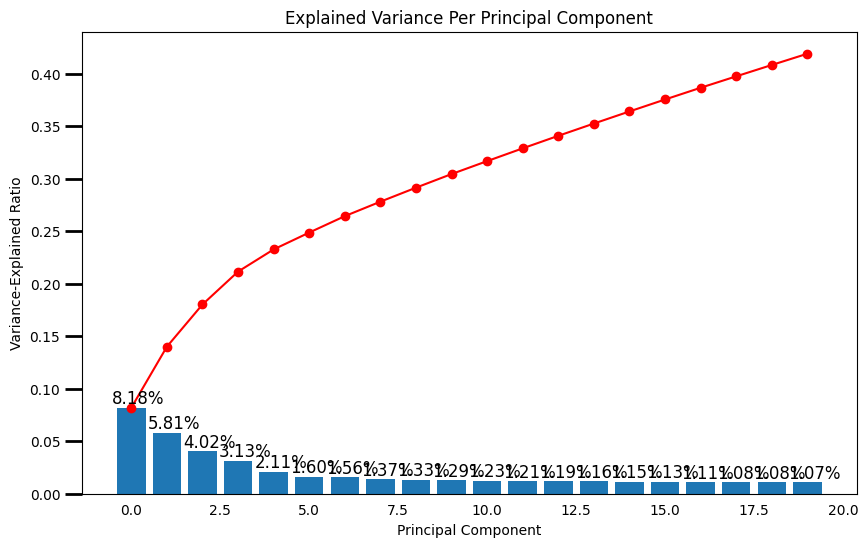

In [47]:
# Investigate the variance accounted for by each principal component.
scree_plot(pca, n_components=20)

In [48]:
from sklearn.decomposition import PCA

# Re-apply PCA to the data while selecting for number of components to retain.
# ok, after some tests, I think I will use 35 main components, because that results in a very good variance ration of 95%
n_features = df_scaled.shape[1]
n_components = n_features // 2

n_components = 100

print(f"Features: {n_features}")
print(f"Components: {n_components}")

# do a PCA
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(df_scaled)

# create new data frame with new principal components
pca_columns = [f'PC{i+1}' for i in range(n_components)]
df_pca = pd.DataFrame(data=principal_components, columns=pca_columns)


Features: 192
Components: 100


### Discussion 2.2: Perform Dimensionality Reduction

I started with num_features / 2 components. That resulted in a good 89% variance ratio (all components added). Then I tried to increase it step wise and I ended with 100 as my final component number because that resulted in roughly 90% ratio. I think, a reduction from 194 original features to 100 features is a very good result.

### Step 2.3: Interpret Principal Components

Now that we have our transformed principal components, it's a nice idea to check out the weight of each variable on the first few components to see if they can be interpreted in some fashion.

As a reminder, each principal component is a unit vector that points in the direction of highest variance (after accounting for the variance captured by earlier principal components). The further a weight is from zero, the more the principal component is in the direction of the corresponding feature. If two features have large weights of the same sign (both positive or both negative), then increases in one tend expect to be associated with increases in the other. To contrast, features with different signs can be expected to show a negative correlation: increases in one variable should result in a decrease in the other.

- To investigate the features, you should map each weight to their corresponding feature name, then sort the features according to weight. The most interesting features for each principal component, then, will be those at the beginning and end of the sorted list. Use the data dictionary document to help you understand these most prominent features, their relationships, and what a positive or negative value on the principal component might indicate.
- You should investigate and interpret feature associations from the first three principal components in this substep. To help facilitate this, you should write a function that you can call at any time to print the sorted list of feature weights, for the *i*-th principal component. This might come in handy in the next step of the project, when you interpret the tendencies of the discovered clusters.

In [49]:
def get_pca_weights(pca, feature_names, component_number=0):    
    # extract weights of component_number
    weights = pca.components_[component_number]
    
    # create a data frame with the feature names and their weiths
    weight_df = pd.DataFrame({'Feature': feature_names, 'Weight': weights})
    
    # sort data frame by weight
    sorted_weights = weight_df.reindex(weight_df.Weight.abs().sort_values(ascending=False).index)
    
    return sorted_weights

In [50]:
# Map weights for the first principal component to corresponding feature names
# and then print the linked values, sorted by weight.

# HINT: Try defining a function here or in a new cell that you can reuse in the
# other cells.
feature_names = df_scaled.columns.tolist()

component_number = 0  # first main component
pca_weights = get_pca_weights(pca, feature_names, component_number)

print(f"Weights  for main component #{component_number+1}. Main component:")
print(pca_weights)

Weights  for main component #1. Main component:
                            Feature    Weight
43                       MOBI_REGIO  0.202519
111              LP_STATUS_GROB_1.0 -0.194307
33                      KBA05_ANTG1  0.190057
1                 FINANZ_MINIMALIST  0.185466
25               HH_EINKOMMEN_SCORE -0.185075
190       CAMEO_INTL_2015_HOUSEHOLD -0.185054
47                       PLZ8_ANTG1  0.183823
49                       PLZ8_ANTG3 -0.182692
37                        KBA05_GBZ  0.180122
50                       PLZ8_ANTG4 -0.177328
51                      PLZ8_BAUMAX -0.172991
55                      ORTSGR_KLS9 -0.153989
39                         EWDICHTE -0.152038
6                  FINANZ_HAUSBAUER -0.149119
53                         PLZ8_GBZ  0.135941
30                      KONSUMNAEHE  0.134222
101              LP_STATUS_FEIN_1.0 -0.128404
40                       INNENSTADT  0.126575
36                      KBA05_ANTG4 -0.125909
48                       PLZ8_AN

In [51]:
# Map weights for the second principal component to corresponding feature names
# and then print the linked values, sorted by weight.
component_number = 1  # first main component
pca_weights = get_pca_weights(pca, feature_names, component_number)

print(f"Weights {component_number+1}. Main component:")
print(pca_weights)

Weights 2. Main component:
                            Feature    Weight
188    PRAEGENDE_JUGENDJAHRE_DECADE  0.238425
0              ALTERSKATEGORIE_GROB -0.234293
2                     FINANZ_SPARER  0.229355
3                  FINANZ_VORSORGER -0.220050
11                        SEMIO_REL  0.218829
5             FINANZ_UNAUFFAELLIGER  0.215663
22                      SEMIO_TRADV  0.208620
21                    SEMIO_PFLICHT  0.206807
4                    FINANZ_ANLEGER  0.202030
129                      ZABEOTYP_3 -0.199804
15                        SEMIO_ERL -0.185549
16                       SEMIO_KULT  0.171467
17                        SEMIO_RAT  0.166595
14                       SEMIO_LUST -0.164303
44                ONLINE_AFFINITAET  0.157716
8                    RETOURTYP_BK_S -0.153614
10                        SEMIO_FAM  0.141538
12                        SEMIO_MAT  0.134450
65                      FINANZTYP_1  0.133948
26                   W_KEIT_KIND_HH -0.123127
60     

In [52]:
# Map weights for the third principal component to corresponding feature names
# and then print the linked values, sorted by weight.
component_number = 2  # first main component
pca_weights = get_pca_weights(pca, feature_names, component_number)

print(f"Weights {component_number+1}. Main component:")
print(pca_weights)

Weights 3. Main component:
                            Feature    Weight
57                      ANREDE_KZ_1  0.328524
58                      ANREDE_KZ_2 -0.328524
13                       SEMIO_VERT  0.300664
20                       SEMIO_KAEM -0.295447
19                        SEMIO_DOM -0.263808
18                       SEMIO_KRIT -0.247018
10                        SEMIO_FAM  0.240210
9                         SEMIO_SOZ  0.239094
16                       SEMIO_KULT  0.232328
15                        SEMIO_ERL -0.189246
17                        SEMIO_RAT -0.153970
4                    FINANZ_ANLEGER -0.148474
69                      FINANZTYP_5  0.127972
1                 FINANZ_MINIMALIST  0.121989
119                 SHOPPER_TYP_0.0  0.110710
127                      ZABEOTYP_1  0.103801
11                        SEMIO_REL  0.097514
65                      FINANZTYP_1 -0.095547
121                 SHOPPER_TYP_2.0 -0.082597
12                        SEMIO_MAT  0.076033
102    

Try out the pca_results function!

In [53]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def pca_results(full_dataset, pca):
    '''
    Create a DataFrame of the PCA results
    Includes dimension feature weights and explained variance
    Visualizes the PCA results using Plotly
    '''

    # Dimension indexing
    dimensions = ['Dimension {}'.format(i) for i in range(1, len(pca.components_) + 1)]

    # PCA components
    components = pd.DataFrame(np.round(pca.components_, 4), columns=full_dataset.keys())
    components.index = dimensions

    # PCA explained variance
    ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1)
    variance_ratios = pd.DataFrame(np.round(ratios, 4), columns=['Explained Variance'])
    variance_ratios.index = dimensions

    # Create a plotly figure
    fig = make_subplots(rows=1, cols=1)

    # Add bar traces for each dimension
    for i, dim in enumerate(dimensions):
        fig.add_trace(
            go.Bar(
                x=components.columns,
                y=components.loc[dim],
                name=dim
            )
        )

    # Update layout for better appearance
    fig.update_layout(
        title='PCA Feature Weights and Explained Variance',
        xaxis_title='Features',
        yaxis_title='Feature Weights',
        barmode='group',
        bargap=0.15,
        bargroupgap=0.1,
        height=600,
        width=1000
    )

    # Add explained variance text annotations
    for i, ev in enumerate(pca.explained_variance_ratio_):
        fig.add_annotation(
            x=i,
            y=max(components.iloc[i]) + 0.1,
            text=f"Explained Variance: {ev:.4f}",
            showarrow=False,
            yshift=10
        )

    # Show the plot
    fig.show()

    # Return a concatenated DataFrame
    return pd.concat([variance_ratios, components], axis=1)

In [54]:
# this is not really helpful, but it was worth a try.(for the learning effect)
pca_results(df_scaled, pca)

,Explained Variance,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
Dimension 1,0.0819,0.0765,0.1855,-0.1068,0.0769,-0.0506,-0.0433,-0.1491,-0.0240,0.0057,-0.0216,-0.0464,-0.0716,-0.0493,0.0442,0.0453,0.0407,-0.0395,-0.0641,-0.0176,-0.0265,-0.0413,-0.0767,-0.0528,0.0825,0.0053,-0.1851,-0.0460,0.0482,-0.1137,-0.0260,0.1342,0.0469,0.0601,0.1901,-0.0102,-0.1147,-0.1259,0.1801,0.0948,-0.1520,0.1266,0.0935,-0.0422,0.2025,0.0573,-0.0638,0.0630,0.1838,-0.1241,-0.1827,-0.1773,-0.1730,-0.0330,0.1359,-0.1154,-0.1540,-0.1072,0.0167,-0.0167,0.0138,0.0398,-0.0159,-0.0165,-0.0075,-0.0119,-0.1072,0.0745,0.0536,-0.0035,-0.0057,0.0241,0.0164,0.0192,0.0126,-0.0145,0.0248,0.0264,0.0374,-0.0047,0.0033,0.0032,-0.0248,-0.0572,-0.1089,0.1089,-0.0854,0.0288,-0.0054,-0.0051,0.0016,0.0058,0.0165,0.0269,0.0041,0.0423,0.0466,-0.0854,0.0288,-0.0046,0.0311,0.0640,-0.1284,-0.1123,-0.0111,0.0196,0.0221,0.0266,0.0133,0.01

### Discussion 2.3: Interpret Principal Components

Ok take a look at:

43                       MOBI_REGIO  0.202519<br>
111              LP_STATUS_GROB_1.0 -0.194307<br>
33                      KBA05_ANTG1  0.190057<br>
1                 FINANZ_MINIMALIST  0.185466<br>


Those are the first four weigths for the first main component #1. Those four features have the biggest positive/negative numbers, so those four components contribute the most to the component. The first main component has a variance ratio of 8.13%. The components following contributing in descending order to the variance ratio. You can see the features and their contribution in the sorted weights list.

**In general**:

High positive or negative weights indicate that the corresponding feature contributes strongly to the principal component.
This information can be used to understand which features play the biggest role in the principal components and which dimensions are most important in the data.

## Step 3: Clustering

### Step 3.1: Apply Clustering to General Population

You've assessed and cleaned the demographics data, then scaled and transformed them. Now, it's time to see how the data clusters in the principal components space. In this substep, you will apply k-means clustering to the dataset and use the average within-cluster distances from each point to their assigned cluster's centroid to decide on a number of clusters to keep.

- Use sklearn's [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) class to perform k-means clustering on the PCA-transformed data.
- Then, compute the average difference from each point to its assigned cluster's center. **Hint**: The KMeans object's `.score()` method might be useful here, but note that in sklearn, scores tend to be defined so that larger is better. Try applying it to a small, toy dataset, or use an internet search to help your understanding.
- Perform the above two steps for a number of different cluster counts. You can then see how the average distance decreases with an increasing number of clusters. However, each additional cluster provides a smaller net benefit. Use this fact to select a final number of clusters in which to group the data. **Warning**: because of the large size of the dataset, it can take a long time for the algorithm to resolve. The more clusters to fit, the longer the algorithm will take. You should test for cluster counts through at least 10 clusters to get the full picture, but you shouldn't need to test for a number of clusters above about 30.
- Once you've selected a final number of clusters to use, re-fit a KMeans instance to perform the clustering operation. Make sure that you also obtain the cluster assignments for the general demographics data, since you'll be using them in the final Step 3.3.

In [55]:
from sklearn.cluster import KMeans

# Over a number of different cluster counts...
cluster_counts = range(2, 31)  # Testing from 2 to 30 clusters
average_distances = []

for k in cluster_counts:
    # run k-means clustering on the data and...
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(principal_components)
    
    # compute the average within-cluster distance
    # negative sign because score() returns negative inertia
    average_distance = -kmeans.score(principal_components) / principal_components.shape[0]
    average_distances.append(average_distance)    

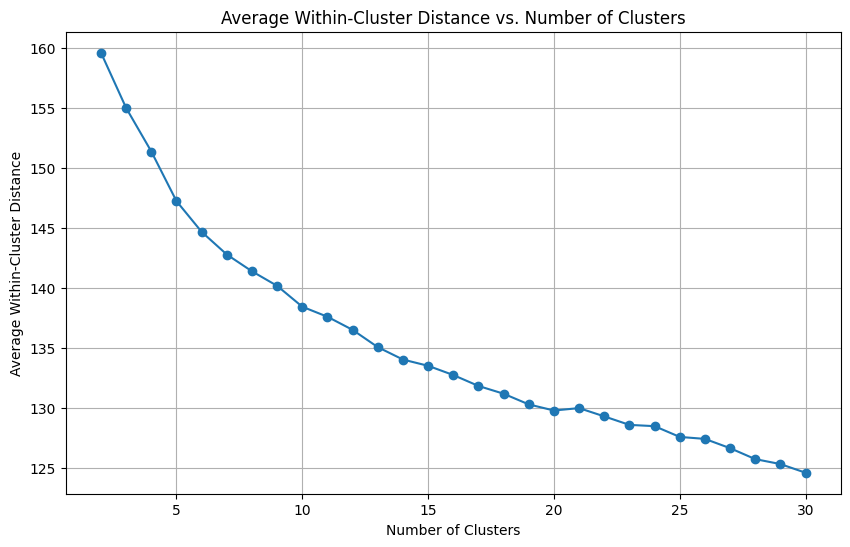

In [56]:
# Investigate the change in within-cluster distance across number of clusters.
# HINT: Use matplotlib's plot function to visualize this relationship.
plt.figure(figsize=(10, 6))
plt.plot(cluster_counts, average_distances, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Average Within-Cluster Distance')
plt.title('Average Within-Cluster Distance vs. Number of Clusters')
plt.grid(True)
plt.show()


In [57]:
from sklearn.cluster import KMeans

# Re-fit the k-means model with the selected number of clusters and obtain
# cluster predictions for the general population demographics data.
optimal_clusters = 10

# Re-fit the k-means model with the selected number of clusters
kmeans_final = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_final.fit(principal_components)

# Obtain the cluster assignments for the data
cluster_assignments = kmeans_final.predict(principal_components)

# Print some results
print("Cluster Centers:\n", kmeans_final.cluster_centers_)
print("Cluster Assignments: (first 20) \n", cluster_assignments[:20])  # Show first 10 assignments

Cluster Centers:
 [[-4.13309696e+00  3.03834515e+00  2.93471199e+00 -5.40780296e-01
   1.29945558e-01 -1.71117086e-02 -8.35922914e-02 -4.04373585e-01
  -1.02986621e-01  1.12995853e-01  2.08734804e-01 -6.79171786e-02
  -6.74276646e-02  3.39128369e-02 -6.99579459e-03  1.07995954e-01
  -1.28592068e-01  3.48811293e-01 -5.39185538e-02 -1.27388376e-01
   1.89597460e-01 -1.98580198e-01 -8.72942740e-02  2.43804130e-01
   4.25886726e-03  1.01403590e-01 -2.25730241e-01 -1.16127372e-01
  -2.13730812e-01 -3.43847479e-02 -3.65977741e-01  1.28749733e-01
   2.73802374e-03  7.17594879e-02 -4.19721630e-01  1.24359451e-02
   1.65111118e-01 -1.15509807e-01  2.08828799e-01 -7.11894200e-02
  -6.96973458e-02 -1.02277463e-01 -1.91293382e-02  1.81987885e-02
   2.97033147e-02 -1.00669812e-02  5.17636029e-02  6.60531226e-03
   3.18875993e-02 -5.14528980e-02 -9.22633655e-03  4.42169482e-02
  -1.07778913e-01  6.66630632e-02  2.49789122e-02 -8.37753582e-02
  -5.03426265e-04 -7.92873850e-02  1.28603287e-01  1.99060

### Discussion 3.1: Apply Clustering to General Population

Based on the plotted average distance curve, I chose 10 as the cluster number because, in my opinion, this is right at the elbow. And 10 sounds like a manageable number of segments.


### Step 3.2: Apply All Steps to the Customer Data

Now that you have clusters and cluster centers for the general population, it's time to see how the customer data maps on to those clusters. Take care to not confuse this for re-fitting all of the models to the customer data. Instead, you're going to use the fits from the general population to clean, transform, and cluster the customer data. In the last step of the project, you will interpret how the general population fits apply to the customer data.

- Don't forget when loading in the customers data, that it is semicolon (`;`) delimited.
- Apply the same feature wrangling, selection, and engineering steps to the customer demographics using the `clean_data()` function you created earlier. (You can assume that the customer demographics data has similar meaning behind missing data patterns as the general demographics data.)
- Use the sklearn objects from the general demographics data, and apply their transformations to the customers data. That is, you should not be using a `.fit()` or `.fit_transform()` method to re-fit the old objects, nor should you be creating new sklearn objects! Carry the data through the feature scaling, PCA, and clustering steps, obtaining cluster assignments for all of the data in the customer demographics data.

I wrote that function to analyse some odds in both data sets (customer and demographics). See later section.

In [58]:
def compare_dataframes(df1, df2):

    columns_equal = list(df1.columns) == list(df2.columns)    
    common_columns = df1.columns.intersection(df2.columns)

    dtypes_equal = all(df1[common_columns].dtypes == df2[common_columns].dtypes)

    if columns_equal and dtypes_equal:
        return "Both DataFrames are structurual equal."
    else:
        differences = []

        if not columns_equal:
            df1_columns = set(df1.columns)
            df2_columns = set(df2.columns)
            only_in_df1 = df1_columns - df2_columns
            only_in_df2 = df2_columns - df1_columns
            if only_in_df1:
                differences.append(f"Columns in df1 only: {only_in_df1}")
            if only_in_df2:
                differences.append(f"Columns in df2 only: {only_in_df2}")

        if not dtypes_equal:
            differing_dtypes = [(col, df1[col].dtype, df2[col].dtype) 
                                for col in common_columns 
                                if df1[col].dtype != df2[col].dtype]
            for col, dtype1, dtype2 in differing_dtypes:
                differences.append(f"Unterschiedlicher Datentyp für Spalte '{col}': df1={dtype1}, df2={dtype2}")

        return "Data Frames aren't structurally equal:\n" + "\n".join(differences)



In [60]:
# Load in the customer demographics data.
df_cust = pd.read_csv(filepath_or_buffer='CUSTOMERS_Subset.csv', delimiter=';')
# df_reduced_encoded, df_feat_reduced_encoded, use_columns_to_drop = clean_data(df_gen)
customers, _, _ = clean_data(df_cust, use_columns_to_drop)

Columns defined in use_columns_to_drop will be dropped: Index(['AGER_TYP', 'GEBURTSJAHR', 'TITEL_KZ', 'ALTER_HH', 'KK_KUNDENTYP',
       'KBA05_BAUMAX'],
      dtype='object')


/tmp/ipykernel_6740/3553727945.py:73: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [61]:
unique_values = df_cust['GEBAEUDETYP'].unique()

print("Unique: Customer")
print(unique_values)

unique_values = df_gen['GEBAEUDETYP'].unique()

print("Unique: GEN")
print(unique_values)


Unique: Customer
[ 1. nan  8.  2.  3.  4.  6.]
Unique: GEN
[nan  8.  1.  3.  2.  6.  4.  5.]


**Problem**

This is a problem if I am to adopt the PCA prefitted values. There is no column GEBAEUDETYP_5.0 in the customer data set after the one hot encode, because the value 5 does not occur im Customer data set.

**Solution**

For the sake of the project I decided to simply drop the GEBAUEDETYP column, because merging the columns in both data sets is too complex for me. And I don't know if this is the right way to handel the problem.

In [24]:
compare_dataframes(df_gen, df_cust)

'Both DataFrames are structurual equal.'

In [25]:
compare_dataframes(df_reduced_encoded, customers)

'Both DataFrames are structurual equal.'

In [26]:
customers.head(5)

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,4.0,5,1,5,1,2,2,1.0,5.0,6,5,2,6,6,7,3,4,1,3,1,1,2,1,2.0,0.0,1.0,6.0,9.0,1.0,0.0,5.0,1992.0,7.0,2.0,2.0,0.0,0.0,4.0,3.0,2.0,4.0,4.0,1.0,4.0,3.0,1.0,1201.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,1.0,2.0,1.0,True,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fa

In [62]:
nan_counts = df_cust.isnull().sum()

# sort after nan counts
sorted_nan_counts = nan_counts.sort_values(ascending=False)

print("Columns with most NaN values:")
print(sorted_nan_counts)

Columns with most NaN values:
KK_KUNDENTYP             111937
KBA05_BAUMAX              55980
KBA05_ANTG2               55980
MOBI_REGIO                55980
KBA05_GBZ                 55980
KBA05_ANTG1               55980
KBA05_ANTG4               55980
KBA05_ANTG3               55980
KKK                       54260
REGIOTYP                  54260
W_KEIT_KIND_HH            53742
PLZ8_ANTG4                52764
PLZ8_ANTG2                52764
PLZ8_ANTG1                52764
PLZ8_ANTG3                52764
PLZ8_BAUMAX               52764
PLZ8_GBZ                  52764
PLZ8_HHZ                  52764
ANZ_HH_TITEL              52110
KBA13_ANZAHL_PKW          51281
ARBEIT                    50476
RELAT_AB                  50476
ORTSGR_KLS9               50476
CAMEO_DEUG_2015           50428
CAMEO_INTL_2015           50428
CAMEO_DEU_2015            50428
EWDICHTE                  49959
BALLRAUM                  49959
INNENSTADT                49959
GEBAEUDETYP_RASTER        49927
OST_WEST_K

In [63]:
# If you've not yet cleaned the dataset of all NaN values, then investigate and
# do that now.
rows_cust_nan = customers.isnull().any(axis=1).sum()
print(f"Number of rows with at least one NaN-value: {rows_cust_nan}")

#numerical_imputer = SimpleImputer(strategy='mean')
numerical_columns = customers.select_dtypes(include=[np.number]).columns
customers[numerical_columns] = numerical_imputer.fit_transform(customers[numerical_columns])

rows_cust_nan = customers.isnull().any(axis=1).sum()

print(f"Number of rows with at least one NaN-value: {rows_cust_nan}")

Number of rows with at least one NaN-value: 26070
Number of rows with at least one NaN-value: 0


In [64]:
nan_counts = customers.isnull().sum()

# sort after nan counts
sorted_nan_counts = nan_counts.sort_values(ascending=False)

print("Columns with most NaN values:")
print(sorted_nan_counts)

Columns with most NaN values:
ALTERSKATEGORIE_GROB              0
FINANZ_MINIMALIST                 0
FINANZ_SPARER                     0
FINANZ_VORSORGER                  0
FINANZ_ANLEGER                    0
FINANZ_UNAUFFAELLIGER             0
FINANZ_HAUSBAUER                  0
HEALTH_TYP                        0
RETOURTYP_BK_S                    0
SEMIO_SOZ                         0
SEMIO_FAM                         0
SEMIO_REL                         0
SEMIO_MAT                         0
SEMIO_VERT                        0
SEMIO_LUST                        0
SEMIO_ERL                         0
SEMIO_KULT                        0
SEMIO_RAT                         0
SEMIO_KRIT                        0
SEMIO_DOM                         0
SEMIO_KAEM                        0
SEMIO_PFLICHT                     0
SEMIO_TRADV                       0
ANZ_PERSONEN                      0
ANZ_TITEL                         0
HH_EINKOMMEN_SCORE                0
W_KEIT_KIND_HH                    

In [30]:
customers.head(4)

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,4.0,5.0,1.0,5.0,1.0,2.0,2.0,1.0,5.0,6.0,5.0,2.0,6.0,6.0,7.0,3.0,4.0,1.0,3.0,1.0,1.0,2.0,1.0,2.0,0.0,1.0,6.000000,9.0,1.000000,0.000000,5.0,1992.0,7.0,2.0,2.0,0.0,0.0,4.0,3.0,2.0,4.0,4.0,1.0,4.0,3.0,1.0,1201.0,3.0,3.0,1.0,0.0,1.0,5.0,5.0,1.0,2.0,1.0,True,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,F

In [65]:
# Apply preprocessing, feature transformation, and clustering from the general
# demographics onto the customer data, obtaining cluster predictions for the
# customer demographics data.
customers_scaled = scaler.transform(customers)
df_cust_scaled = pd.DataFrame(customers_scaled, columns=customers.columns)

In [66]:
df_cust_scaled.head(2)

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,1.184892,1.409077,-1.155482,1.138133,-1.24996,-0.470299,-0.791347,-1.625575,1.073653,0.958341,0.463245,-1.043961,1.104184,0.885447,1.267957,-0.888005,-0.067417,-1.750649,-0.880231,-1.946324,-1.763850,-1.178258,-1.543029,0.234378,-0.060412,-2.209229,1.074037,0.56721,-0.471161,-0.125746,1.274878,-0.383241,1.511782,0.36961,0.605197,-0.63232,-0.491462,0.649379,-0.528189,-1.128561,-0.270884,0.283508,-1.834893,0.744290,0.172157,-1.97255,1.723132,0.779618,0.218507,-0.612420,-0.975858,-0.656304,1.445477,1.478082,-2.174539,-1.433574,-1.526303,1.043914,-1.043914,-0.363889,-0.463801,-0.475617,-0.575027,2.486346,-0.382997,-0.572787,2.572389,-0.243824,-0.274507,-0.392086,-0.753661,-0.260355,-0.241081,-0.267002,3.493775,-0.311305,-0.182568,-0.23177,-0.340787,-0.277685,-0.384609,-0.322324,-0.441648,-1.885219,1.885219,-1.008959,2.664007,-0.076875,-0.12131

In [67]:
df_cust_scaled.describe()

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
count,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.000000,141713.

It is important to note here, that the **std** is not identical to the Scaler Application on the General Population Data set. But that is ok so.

In [68]:
# ToDo: columns are missing if you use columns_to_scale
# apply fitting from before
principal_components_cust = pca.transform(df_cust_scaled)

pca_columns = [f'PC{i+1}' for i in range(n_components)]
df_cust_pca = pd.DataFrame(data=principal_components_cust, columns=pca_columns)

In [69]:
df_cust_pca.head(2)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100
0,6.970215,-2.651494,4.130970,2.631152,1.951034,-1.491627,-0.864413,-0.146157,-0.706548,4.767202,1.475736,-0.712884,1.123068,1.148229,0.234324,1.903054,-2.083059,0.466570,2.489881,-0.371565,1.36790,-2.029595,3.604863,2.415607,-1.013671,-0.369410,0.507956,-0.895888,-1.772710,0.153304,-0.091052,0.429561,-1.279292,-0.190198,1.144225,-0.264384,-0.606292,0.328096,-1.217856,0.389795,0.363004,-2.050896,-0.118479,0.58131,0.557198,-0.950676,-0.018025,-0.618415,-0.742646,0.687826,0.072734,0.785759,-0.191220,0.403062,0.106899,-0.046682,0.076467,-0.497576,-1.411349,1.966420,0.971428,0.692468,0.408763,0.572635,-1.179230,2.029004,2.161378,-0.432046,0.553213,-1.895457,-1.716915,-1.150905,0.595104,3.545019,-0.906217,-0.708819,1.294993,0.698497,-0.368705,-1.115274,-0.532793,-0.775139,0.660871,-1.022264,-0.927872,-0.420812,-0.491641,0.040421,0.348129,1.695600,0.370012,-1.579576,0.395747,0.699345,-1.815203,-2.117331,1.629273,0.917226,-0.447293,-0.150681
1,1.938371,-5.774816,-0.739503,4.134731,2.677349,1.084873,0.289302,0.274502,0.499922,-1.280815,-0.149901,0.827810,0.575668,-0.639181,2.420900,-1.118390,1.346212,2.244221,-2.081614,1.585101,1.90545,-2.023288,0.141524,-1.434219,0.151915,-0.651735,-2.122486,0.368146,1.329482,2.258002,-2.116963,-0.380837,-2.039943,-1.243047,-0.522510,-0.135890,0.034037,-0.280296,-0.633641,-0.617260,1.497492,-1.049309,-0.453798,0.81868,0.867339,0.855509,-0.907907,1.835365,0.812600,-0.657663,0.263984,-0.329897,0.165994,0.437444,0.637137,0.343588,0.791217,-0.381080,0.492951,-0.642348,0.156602,0.071379,-0.351831,-0.507487,-1.458446,-1.032575,-1.045007,-0.003439,0.042222,-1.657554,-0.557159,-0.505113,0.710164,-0.994719,0.125122,-0.247658,0.409019,-0.076581,-0.594061,-0.697522,0.145171,0.955940,0.245158,-2.719389,-0.688845,0.319440,0.900076,1.747888,2.136397,1.094041,0.865632,1.009727,1.475740,0.742307,0.416387,0.741420,0.850088,1.069405,-1.543955,-0.411155


In [70]:
cluster_assignments_cust = kmeans_final.predict(principal_components_cust)

### Step 3.3: Compare Customer Data to Demographics Data

At this point, you have clustered data based on demographics of the general population of Germany, and seen how the customer data for a mail-order sales company maps onto those demographic clusters. In this final substep, you will compare the two cluster distributions to see where the strongest customer base for the company is.

Consider the proportion of persons in each cluster for the general population, and the proportions for the customers. If we think the company's customer base to be universal, then the cluster assignment proportions should be fairly similar between the two. If there are only particular segments of the population that are interested in the company's products, then we should see a mismatch from one to the other. If there is a higher proportion of persons in a cluster for the customer data compared to the general population (e.g. 5% of persons are assigned to a cluster for the general population, but 15% of the customer data is closest to that cluster's centroid) then that suggests the people in that cluster to be a target audience for the company. On the other hand, the proportion of the data in a cluster being larger in the general population than the customer data (e.g. only 2% of customers closest to a population centroid that captures 6% of the data) suggests that group of persons to be outside of the target demographics.

Take a look at the following points in this step:

- Compute the proportion of data points in each cluster for the general population and the customer data. Visualizations will be useful here: both for the individual dataset proportions, but also to visualize the ratios in cluster representation between groups. Seaborn's [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html) or [`barplot()`](https://seaborn.pydata.org/generated/seaborn.barplot.html) function could be handy.
  - Recall the analysis you performed in step 1.1.3 of the project, where you separated out certain data points from the dataset if they had more than a specified threshold of missing values. If you found that this group was qualitatively different from the main bulk of the data, you should treat this as an additional data cluster in this analysis. Make sure that you account for the number of data points in this subset, for both the general population and customer datasets, when making your computations!
- Which cluster or clusters are overrepresented in the customer dataset compared to the general population? Select at least one such cluster and infer what kind of people might be represented by that cluster. Use the principal component interpretations from step 2.3 or look at additional components to help you make this inference. Alternatively, you can use the `.inverse_transform()` method of the PCA and StandardScaler objects to transform centroids back to the original data space and interpret the retrieved values directly.
- Perform a similar investigation for the underrepresented clusters. Which cluster or clusters are underrepresented in the customer dataset compared to the general population, and what kinds of people are typified by these clusters?

In [71]:
cluster_assignments

array([9, 8, 2, ..., 5, 0, 3], dtype=int32)

In [72]:
# Compare the proportion of data in each cluster for the customer data to the
# proportion of data in each cluster for the general population.

def compare_cluster_proportions(demographic_clusters, customer_clusters, n_clusters=10):
    # Step 1: Calculate the frequencies of the cluster assignments (np.bincount)
    # Step 2: Calculate Proportions (divide by len(clusters)
    demo_props = np.bincount(demographic_clusters) / len(demographic_clusters)
    customer_props = np.bincount(customer_clusters) / len(customer_clusters)
    
    # Create DataFrame for visualization
    cluster_df = pd.DataFrame({
        'Cluster': range(n_clusters),
        'General Population': demo_props,
        'Customers': customer_props
    })

    # Step 3: Visualise distributions
    cluster_df_melted = cluster_df.melt(id_vars='Cluster', var_name='Group', value_name='Proportion')
    plt.figure(figsize=(12, 6))
    sns.barplot(data=cluster_df_melted, x='Cluster', y='Proportion', hue='Group')
    plt.title('Cluster Proportions: General Population vs. Customers')
    plt.show()

    # Identify and interpret overrepresented and underrepresented clusters
    overrepresented = cluster_df[cluster_df['Customers'] > cluster_df['General Population']]
    underrepresented = cluster_df[cluster_df['Customers'] < cluster_df['General Population']]

    print("Overrepresented Clusters:")
    print(overrepresented)

    print("\nUnderrepresented Clusters:")
    print(underrepresented)


Features are of course the same, because the PCA was fitted with the demographic (training) data set.

In [73]:
pca_weights = get_pca_weights(pca, customers.columns, component_number=0).head(10)

print(f"Weights 1. Main component:")
print(pca_weights)

pca_weights = get_pca_weights(pca, customers.columns, component_number=1).head(10)

print()
print(f"Weights 2. Main component:")
print(pca_weights)

Weights 1. Main component:
                       Feature    Weight
43                  MOBI_REGIO  0.202519
111         LP_STATUS_GROB_1.0 -0.194307
33                 KBA05_ANTG1  0.190057
1            FINANZ_MINIMALIST  0.185466
25          HH_EINKOMMEN_SCORE -0.185075
190  CAMEO_INTL_2015_HOUSEHOLD -0.185054
47                  PLZ8_ANTG1  0.183823
49                  PLZ8_ANTG3 -0.182692
37                   KBA05_GBZ  0.180122
50                  PLZ8_ANTG4 -0.177328

Weights 2. Main component:
                          Feature    Weight
188  PRAEGENDE_JUGENDJAHRE_DECADE  0.238425
0            ALTERSKATEGORIE_GROB -0.234293
2                   FINANZ_SPARER  0.229355
3                FINANZ_VORSORGER -0.220050
11                      SEMIO_REL  0.218829
5           FINANZ_UNAUFFAELLIGER  0.215663
22                    SEMIO_TRADV  0.208620
21                  SEMIO_PFLICHT  0.206807
4                  FINANZ_ANLEGER  0.202030
129                    ZABEOTYP_3 -0.199804


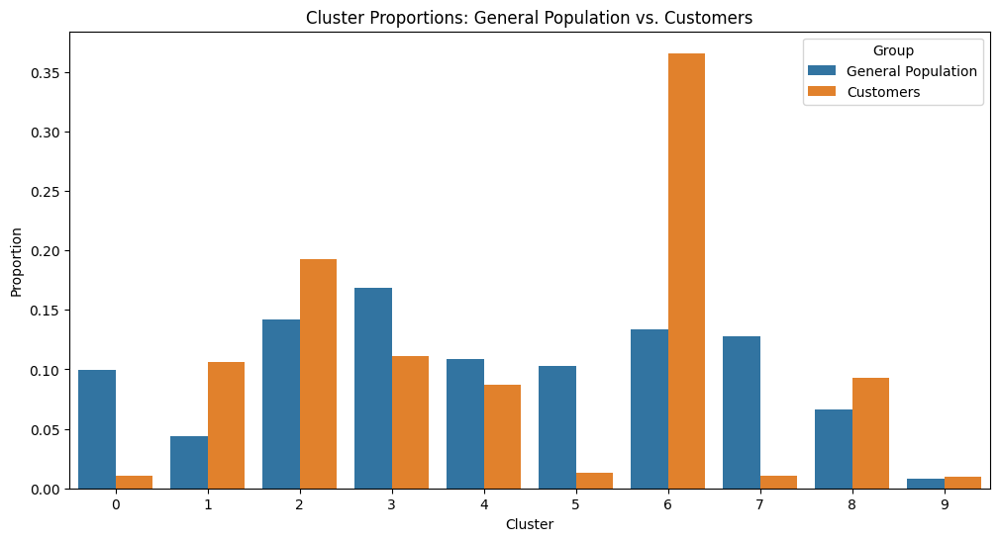

Overrepresented Clusters:
   Cluster  General Population  Customers
1        1            0.043602   0.106455
2        2            0.141712   0.192227
6        6            0.133461   0.365732
8        8            0.066258   0.093090
9        9            0.008416   0.009844

Underrepresented Clusters:
   Cluster  General Population  Customers
0        0            0.099175   0.010190
3        3            0.168319   0.111267
4        4            0.108636   0.087240
5        5            0.103004   0.013189
7        7            0.127416   0.010768


In [74]:
compare_cluster_proportions(cluster_assignments, cluster_assignments_cust, 10)

One can clearly see that cluster 6 (seventh second cluster) has a two different bars. That means for that cluster the share of general population (demographic) rows (data points) is much less then the share of data points (rows) of the customer data set that fall into cluster 1.

In [76]:
# transform back the centroids to the orginal space
centroids_pca = kmeans_final.cluster_centers_
centroids_original = pca.inverse_transform(centroids_pca)
centroids_original_unscaled = scaler.inverse_transform(centroids_original)

# create data frames for further visualisations
centroids_df = pd.DataFrame(centroids_original_unscaled, columns=customers.columns)

# filter data for cluster 7 (index 6)
cluster_index = 7
customer_cluster_7 = customers[cluster_assignments_cust == cluster_index]
demo_cluster_7 = df_reduced_encoded[cluster_assignments == cluster_index]

In [77]:
customer_cluster_7.head(5) # rows of customer set belongig to cluster 2

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
615,3.0,1.0,4.0,1.0,4.0,4.0,4.0,2.000000,1.0,5.0,3.0,3.0,5.0,3.0,6.0,6.0,1.0,4.0,4.0,7.0,7.0,4.0,2.0,4.0,0.0,6.0,1.000000,8.0,3.0,0.0,4.0,1992.0,2.0,0.0,3.0,2.0,0.0,2.0,6.0,5.0,3.0,2.0,3.0,2.0,5.0,6.0,615.0,2.0,4.0,2.0,0.0,2.0,4.0,3.0,4.0,7.0,5.0,False,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,True,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fals

In [78]:
demo_cluster_7.head(5) # rows of demographic set belongig to cluster 2

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
31,2.0,1,5,2,3,5,4,1.0,1.0,4,2,5,7,3,1,5,5,7,4,7,7,6,7,1.0,0.0,6.0,6.0,9.0,11.0,0.0,1.0,1992.0,2.0,0.0,3.0,3.0,0.0,2.0,1.0,6.0,1.0,3.0,3.0,1.0,2.0,7.0,348.0,1.0,3.0,3.0,2.0,5.0,4.0,2.0,4.0,8.0,5.0,False,True,False,False,False,False,False,True,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,

In [79]:
# Selection of top features based on PCA weights
def get_top_features(pca, feature_names, n_features=3, num_components=2):
    top_features = set()
    for i in range(num_components):
        weights = pca.components_[i]
        weight_df = pd.DataFrame({'Feature': feature_names, 'Weight': weights})
        sorted_weights = weight_df.reindex(weight_df.Weight.abs().sort_values(ascending=False).index)
        top_features.update(sorted_weights.head(n_features)['Feature'].tolist())
    return list(top_features)

In [80]:
top_features = get_top_features(pca, customers.columns, n_features=1, num_components=100)

Ok, playing around with most important features and finding out which rows belong to which cluster I decided to simply analyze the centroids of the clusters. This makes sense, because a centroid is a mean of all rows.

Ok, lets identify the persons by the centroid of the clusters. I choose cluster 7 (index=6) as a cluster in which customers are overrepresented and cluster 1 (index=0) in which customers are underrepresented.

In [81]:
# What kinds of people are part of a cluster that is overrepresented in the
# customer data compared to the general population?
# analyze cluster 7 (get centroid for cluster 7)
# this is how to calculate the centroid for the cluster 7, that centroid must be inverse transformed
centroids_pca = kmeans_final.cluster_centers_
centroids_centroid7_original = pca.inverse_transform(centroids_pca[6])
centroids_original_unscaled = scaler.inverse_transform(centroids_centroid7_original.reshape(1, -1))
cluster_centroid_7_df = pd.DataFrame(centroids_original_unscaled, columns=customers.columns)
cluster_centroid_7_df

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,3.140572,4.494108,1.914341,3.897664,2.04012,2.416624,1.909467,2.118218,3.570892,4.180809,3.707196,3.351109,3.413937,4.755676,4.899172,4.885471,3.814561,3.410064,4.30969,4.608364,4.141538,3.544327,3.350082,2.256592,-0.001895,2.338248,3.786446,8.518748,1.526854,0.002857,3.512635,1993.408942,3.407236,2.826836,1.053219,0.036078,0.015,4.142049,4.1785,3.821655,4.760593,4.076461,2.27287,4.219945,3.326133,3.609983,698.571896,2.828356,2.520538,1.14548,0.366952,1.202721,3.670946,3.909614,2.953109,5.145295,2.832652,0.521822,0.478178,0.119238,0.22102,0.173697,0.208486,0.128428,0.141762,-0.001336,0.24312,0.156957,0.047028,0.185915,0.368317,0.064414,0.063201,0.0953,0.059434,0.130258,0.047382,0.101237,0.135638,0.056806,0.141897,0.052009,0.045057,-0.014318,1.014318,0.274631,0.173994,0.002085,0.009824,0.014304,0.011104,0.037774,0.055281,0.016445,0.248052,0

People in Cluster 7: (customers are overrepresented)

Example features to characterize people of cluster 7:

- Age: 46 - 60 years old
- Praegende Jugendjahre_Decade: 1960 - 1970
- CAMEO_INTL_2015_HOUSEHOLD: Prosperous Households
- CAMEO_INTL_2015_MARRIAGE_STATE: Families With School Age Children
- Anrede_KZ: equal share of female and males
- Green Avantgarde: 1.014318 = membership, Predominant share is member of a environmental friendly organisation

In [82]:
# What kinds of people are part of a cluster that is underrepresented in the
# customer data compared to the general population?
# analyze cluster 1
centroids_centroid1_original = pca.inverse_transform(centroids_pca[0])
centroids_original1_unscaled = scaler.inverse_transform(centroids_centroid1_original.reshape(1, -1))
cluster_centroid_1_df = pd.DataFrame(centroids_original1_unscaled, columns=customers.columns)
cluster_centroid_1_df

,ALTERSKATEGORIE_GROB,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_VORSORGER,FINANZ_ANLEGER,FINANZ_UNAUFFAELLIGER,FINANZ_HAUSBAUER,HEALTH_TYP,RETOURTYP_BK_S,SEMIO_SOZ,SEMIO_FAM,SEMIO_REL,SEMIO_MAT,SEMIO_VERT,SEMIO_LUST,SEMIO_ERL,SEMIO_KULT,SEMIO_RAT,SEMIO_KRIT,SEMIO_DOM,SEMIO_KAEM,SEMIO_PFLICHT,SEMIO_TRADV,ANZ_PERSONEN,ANZ_TITEL,HH_EINKOMMEN_SCORE,W_KEIT_KIND_HH,WOHNDAUER_2008,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,KONSUMNAEHE,MIN_GEBAEUDEJAHR,WOHNLAGE,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_GBZ,BALLRAUM,EWDICHTE,INNENSTADT,GEBAEUDETYP_RASTER,KKK,MOBI_REGIO,ONLINE_AFFINITAET,REGIOTYP,KBA13_ANZAHL_PKW,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_HHZ,PLZ8_GBZ,ARBEIT,ORTSGR_KLS9,RELAT_AB,ANREDE_KZ_1,ANREDE_KZ_2,CJT_GESAMTTYP_1.0,CJT_GESAMTTYP_2.0,CJT_GESAMTTYP_3.0,CJT_GESAMTTYP_4.0,CJT_GESAMTTYP_5.0,CJT_GESAMTTYP_6.0,FINANZTYP_1,FINANZTYP_2,FINANZTYP_3,FINANZTYP_4,FINANZTYP_5,FINANZTYP_6,GFK_URLAUBERTYP_1.0,GFK_URLAUBERTYP_2.0,GFK_URLAUBERTYP_3.0,GFK_URLAUBERTYP_4.0,GFK_URLAUBERTYP_5.0,GFK_URLAUBERTYP_6.0,GFK_URLAUBERTYP_7.0,GFK_URLAUBERTYP_8.0,GFK_URLAUBERTYP_9.0,GFK_URLAUBERTYP_10.0,GFK_URLAUBERTYP_11.0,GFK_URLAUBERTYP_12.0,GREEN_AVANTGARDE_0,GREEN_AVANTGARDE_1,LP_FAMILIE_FEIN_1.0,LP_FAMILIE_FEIN_2.0,LP_FAMILIE_FEIN_3.0,LP_FAMILIE_FEIN_4.0,LP_FAMILIE_FEIN_5.0,LP_FAMILIE_FEIN_6.0,LP_FAMILIE_FEIN_7.0,LP_FAMILIE_FEIN_8.0,LP_FAMILIE_FEIN_9.0,LP_FAMILIE_FEIN_10.0,LP_FAMILIE_FEIN_11.0,LP_FAMILIE_GROB_1.0,LP_FAMILIE_GROB_2.0,LP_FAMILIE_GROB_3.0,LP_FAMILIE_GROB_4.0,LP_FAMILIE_GROB_5.0,LP_STATUS_FEIN_1.0,LP_STATUS_FEIN_2.0,LP_STATUS_FEIN_3.0,LP_STATUS_FEIN_4.0,LP_STATUS_FEIN_5.0,LP_STATUS_FEIN_6.0,LP_STATUS_FEIN_7.0,LP_STATUS_FEIN_8.0,LP_STATUS_FEIN_9.0,LP_STATUS_FEIN_10.0,LP_STATUS_GROB_1.0,LP_STATUS_GROB_2.0,LP_STATUS_GROB_3.0,LP_STATUS_GROB_4.0,LP_STATUS_GROB_5.0,NATIONALITAET_KZ_1.0,NATIONALITAET_KZ_2.0,NATIONALITAET_KZ_3.0,SHOPPER_TYP_0.0,SHOPPER_TYP_1.0,SHOPPER_TYP_2.0,SHOPPER_TYP_3.0,SOHO_KZ_0.0,SOHO_KZ_1.0,VERS_TYP_1.0,VERS_TYP_2.0,ZABEOTYP_1,ZABEOTYP_2,ZABEOTYP_3,ZABEOTYP_4,ZABEOTYP_5,ZABEOTYP_6,OST_WEST_KZ_0,OST_WEST_KZ_1,CAMEO_DEUG_2015_1,CAMEO_DEUG_2015_2,CAMEO_DEUG_2015_3,CAMEO_DEUG_2015_4,CAMEO_DEUG_2015_5,CAMEO_DEUG_2015_6,CAMEO_DEUG_2015_7,CAMEO_DEUG_2015_8,CAMEO_DEUG_2015_9,CAMEO_DEU_2015_1A,CAMEO_DEU_2015_1B,CAMEO_DEU_2015_1C,CAMEO_DEU_2015_1D,CAMEO_DEU_2015_1E,CAMEO_DEU_2015_2A,CAMEO_DEU_2015_2B,CAMEO_DEU_2015_2C,CAMEO_DEU_2015_2D,CAMEO_DEU_2015_3A,CAMEO_DEU_2015_3B,CAMEO_DEU_2015_3C,CAMEO_DEU_2015_3D,CAMEO_DEU_2015_4A,CAMEO_DEU_2015_4B,CAMEO_DEU_2015_4C,CAMEO_DEU_2015_4D,CAMEO_DEU_2015_4E,CAMEO_DEU_2015_5A,CAMEO_DEU_2015_5B,CAMEO_DEU_2015_5C,CAMEO_DEU_2015_5D,CAMEO_DEU_2015_5E,CAMEO_DEU_2015_5F,CAMEO_DEU_2015_6A,CAMEO_DEU_2015_6B,CAMEO_DEU_2015_6C,CAMEO_DEU_2015_6D,CAMEO_DEU_2015_6E,CAMEO_DEU_2015_6F,CAMEO_DEU_2015_7A,CAMEO_DEU_2015_7B,CAMEO_DEU_2015_7C,CAMEO_DEU_2015_7D,CAMEO_DEU_2015_7E,CAMEO_DEU_2015_8A,CAMEO_DEU_2015_8B,CAMEO_DEU_2015_8C,CAMEO_DEU_2015_8D,CAMEO_DEU_2015_9A,CAMEO_DEU_2015_9B,CAMEO_DEU_2015_9C,CAMEO_DEU_2015_9D,CAMEO_DEU_2015_9E,PRAEGENDE_JUGENDJAHRE_DECADE,PRAEGENDE_JUGENDJAHRE_MOVEMENT,CAMEO_INTL_2015_HOUSEHOLD,CAMEO_INTL_2015_MARRIAGE_STATE
0,1.919684,2.000897,4.27178,2.138233,3.495468,3.690103,3.501744,2.377791,2.695414,6.433869,6.669542,6.131682,5.153077,6.035589,3.008521,2.312153,6.796032,4.065867,2.882634,2.907667,2.435573,5.512809,4.818149,1.447759,0.000504,5.484356,4.356728,7.048684,14.533459,0.050682,2.265383,1992.581244,3.674647,0.523833,1.371329,1.106534,0.558894,2.313557,3.541214,4.78813,3.7254,3.432539,2.953454,1.910223,2.993731,4.935205,554.118586,1.643258,3.193439,2.225898,1.149503,2.816693,3.756683,2.886283,3.566941,6.510786,3.565954,1.039746,-0.039746,0.007474,0.008393,0.310907,0.434874,0.146856,0.087041,0.531811,0.000942,0.026891,0.17329,0.04361,0.223455,0.058677,0.04708,0.035926,0.047917,0.040559,0.011137,0.018394,0.098826,0.087076,0.110696,0.132772,0.306486,0.915953,0.084047,0.64902,0.073745,0.005639,0.012697,0.012584,0.013344,0.021363,0.014836,0.014945,0.1174

People in Cluster 10: (customers are underrepresented)

Example features to characterize people of cluster 10:

- Age: < 30 up to 45
- Praegende Jugendjahre_Decade: 1980
- CAMEO_INTL_2015_HOUSEHOLD: Less Affluent Households
- CAMEO_INTL_2015_MARRIAGE_STATE: Young Couples With Children
- Anrede_KZ: predominant share male persons
- Green Avantgarde: predominant share no membership

### Discussion 3.3: Compare Customer Data to Demographics Data

I analyzed 2 clusters by calculating back the centroid. Then I picked out representative features (for me) and compared them with the data in Data_Dictionary. The result was as follows:

People in the Customer dataset are overrepresented in cluster 7. These people are relatively old (46 -60), have already earned (or inherited) some wealth and have children of school age. They are roughly equally shared betwen men and women and were predominantly members of some kind of environmental protection organisation in their youth.

Customers are significantly underrepresented in cluster 1. These people are unlikely to be addressed by the company's products.

Some characteristics of these people:

- younger than 30 years
- Youthful years in the 80s (related to age)
- are less affluent
- Have young children
- mostly men
- and not a member of an environmental organisation

> Congratulations on making it this far in the project! Before you finish, make sure to check through the entire notebook from top to bottom to make sure that your analysis follows a logical flow and all of your findings are documented in **Discussion** cells. Once you've checked over all of your work, you should export the notebook as an HTML document to submit for evaluation. You can do this from the menu, navigating to **File -> Download as -> HTML (.html)**. You will submit both that document and this notebook for your project submission.